In [ ]:
#python -m spacy download en_core_web_lg

In [1]:
import spacy
nlp = spacy.load("en_core_web_lg")
from spacy.lang.en import STOP_WORDS 

import re
import unicodedata

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score
from sklearn.feature_selection import RFE, SelectKBest, chi2

from tqdm import tqdm
from math import log

from imblearn.over_sampling import RandomOverSampler
from collections import Counter

import datetime

def counter(word):
    global df_model
    return df_model[word].sum()

def make_list(input_string):
        '''creates a list of chars form given string'''
        char_list = []
        for l in input_string:
            char_list.append(l)
        return char_list
    
def make_dict(input_string):
        '''creates a dictionary of unique words used in text, with frequency as value'''
        words_dict = dict()
        temp_list = input_string.split()
        for item in temp_list:
            if item not in words_dict:
                words_dict[item] = 1
            else:
                words_dict[item] += 1
        return words_dict

def prepare_string(input_string):
    global if_dict, master_dict, error_dict, failed_error_dict, stopwords,failed_scrabble, failed_words, total_words, failed_to_lemmatize, scrabble_words, lemmatized_1st, lemmatized_2nd, lemmatized_3rd
    # 1. Convert to lowercase
    lowercase_string = input_string.lower()
    # 2. Exclude everything except letters and spaces and "-"
    prelemma_string = ""
    spacing = True
    for char in lowercase_string:
        if char in let_low:
            spacing = True
            prelemma_string += char
        elif (char == ' ' or char=='\n'):
            if spacing == True:
                prelemma_string += " "
                spacing = False
        else:
            spacing = False
    
    # 3. Perform lemmatization
    doc = nlp(prelemma_string)
    lemmatized_string = ""
    for token in doc: 
        success = False
        total_words += 1
        
         #1st instance --> spacy's lemmatization
        if token.has_vector and ignore_stopwords == False:
            lemmatized_string += token.lemma_.lower() + " "
            lemmatized_1st.append(token.text + " --> " + token.lemma_)
            success = True 
        if token.has_vector and ignore_stopwords == True:
            if token.text not in STOP_WORDS:
                lemmatized_string += token.lemma_.lower() + " "
                lemmatized_1st.append(token.text + " --> " + token.lemma_)
                success = True
            if token.text in STOP_WORDS:
                success = True
            
        #2nd instance --> common error vocabulary:
        if success == False:
            if token.text in error_dict:
                temp_token = nlp(error_dict[token.text])
                for tok in temp_token:
                    if tok.has_vector and ignore_stopwords == False:
                        lemmatized_string += tok.lemma_.lower() + " "
                        lemmatized_2nd.append(token.text + "-->" + tok.lemma_.lower())
                        success = True
                    if tok.has_vector and ignore_stopwords == True:
                        if tok.lemma_ not in STOP_WORDS:
                            lemmatized_string += tok.lemma_.lower() + " "
                            lemmatized_2nd.append(token.text + "-->" + tok.lemma_.lower())
                            success = True
                        if tok.lemma_ in STOP_WORDS:
                            success = True
                    if tok.has_vector == False: #being in predefined error dictionary but failed to lemmatize by spacy
                        failed_error_dict.append(tok.text.lower()) 
        #if everything above fails add words to the dictionary of unnlemmatized    
        if success == False: 
                if ignore_stopwords == False:
                    lemmatized_string += "#failed" + " "
                    failed_words += 1
                    if token.text in failed_to_lemmatize:
                        failed_to_lemmatize[token.text] += 1
                    else:
                        failed_to_lemmatize[token.text] = 1
                if ignore_stopwords == True and token.lemma_ not in STOP_WORDS:
                    lemmatized_string += "#failed" + " "
                    failed_words += 1
                    if token.text in failed_to_lemmatize:
                        failed_to_lemmatize[token.text] += 1
                    else:
                        failed_to_lemmatize[token.text] = 1
    
    #using a previous master dictionary (option for target set):
    if if_dict == True:
        to_check = lemmatized_string.split()
        in_dict = []
        for word in to_check:
            if word in master_dict or word=='#failed':
                in_dict.append(word.lower())
            else:
                in_dict.append('#unique')
        new_lemmatized_string = ' '.join(in_dict)
    
    if if_dict == False:
        new_lemmatized_string = lemmatized_string
                
    return new_lemmatized_string.lower()

def make_dict_from_column(df_column):
    '''creates a sorted dictionary of unique words used in whole dataframe column, values are lists, first'''
    words_dict = dict()
    for row_value in df_column:
        temp_list = row_value.split()
        for item in temp_list:
            if item not in words_dict:
                words_dict[item] = 1
            else:
                words_dict[item] += 1 
        
    return dict(sorted(words_dict.items()))

def how_many_cases(word,df_column):
    '''count how many rows include the word'''
    num = 0
    for item in df_column:
        if word in item:
            num += 1
    return num    

def create_score_column(base, key, count_column, method, v_neg, idf_all,idf_word):
    '''Creates a column with given values
        base - dictionary to look up words /dictionary
        key - word to check  /string
        count_column - from which columnn /string
        method - hyperparamether / string (binary,count,frequency or TF)
        v_neg - value if negative /integer or formula
    '''
    if method == "binary" and key in base:
        return 1
    if method == "count" and key in base:
        return base[key]
    if method == "frequency" and key in base:
        return (base[key]/count_column)
    if method == "IDF" and key in base:
        return (1+log(idf_all/idf_word))
    if method == "TFIDF"and key in base:
        return (base[key]/count_column)*(1+log(idf_all/idf_word))
    if key not in base:
        return v_neg
    

def word_counter(dict):
    '''Counts words in a dictionary'''
    count = 0
    for key in dict:
        if key != '#stop': #ignore stopwords
            count += dict[key]
    return count

def failed_count(dict):
    '''Count words failed to lemmatize'''
    if "#failed" in dict.keys(): 
        return dict['#failed']
    else:
        return 0 

def unique_count(dict):
    '''Counts unique words'''
    if "#unique" in dict.keys(): 
        return dict['#unique']
    else:
        return 0 

def standarize(value,maximum):
    ''' '''
    if value == 1:
        return 0
    elif value > 1:
        return (value - 1)/(maximum - 1)
    elif value < 1:
        return (value - 1)
    else:
        return None

def check_similarity(txt):
    '''Checks whether given text is similar to any item in the list. List and cut off defined globally'''
    global doc_sim_list
    global similarity_cut_off
    doc1 = nlp(txt)
    for item in doc_sim_list:
        if (doc1.similarity(item) >= similarity_cut_off):
            return 1     
    return 0
        
#Global variables:
failed_to_lemmatize = dict()
failed_words = 0
total_words = 0 
failed_error_dict = []
lemmatized_1st = []
lemmatized_2nd = []
master_dict = dict()

let_low = make_list("weęrtyuioópaąsśdfghjklłzżxźcćvbnńmq-") # list of possible chars
#Instance 2 vocabulary:
fin = open('error_dict.txt', encoding="utf8")
error_dict = dict() #dict for correcting common mistakes by customers
for line in fin:
    text = line.split(":")
    error_dict[text[0]] = text[1]

pd.options.display.max_columns = 50

In [2]:
#HYPERPARAMETRES:
#Sets:
init_set = "df_nlp_teacher.csv"
target_set = "df_nlp_student.csv"
desc_column_name = 'text' 
target_column_name = '#fraudulent'

#NLP:
score_type = "TFIDF" #binary,count,frequency, IDF or TFIDF
ignore_stopwords = True #if true stopwords won't be lemmatized
similarity_cut_off = 0.99 #value for scoring the similarity variable

#Data processing and choosing variables:
min_words = 0 #cases not meeting the requirement will be cut out of training set (rows)
fraud_only = False #if True columns will be limited to words appearing only in target class
low_cut = False #if True words not meeting the requirement will be cut out of set (columns)
at_least = 2
oversample = True
over_proportion = 10 #denominator value of classification proportion, 2 -> 50%, 10 --> 10%, 20 -> 5% etc. 
if_k_best = True
how_much_var = 5000

#Training models
lr_search = False #if True optimizing parameters for logreg model will be performed 
scoring_lr = 'recall'
param_grid_lr = {'C' : [0.1,1,10,100],
             'penalty' : ['l1','l2','none']}
svm_search = False #if True optimizing parameters for logreg model will be permofrmed 
scoring_svm = 'recall'
param_grid = {'C' : [0.1,1,10,100],
             'kernel' : ['linear','rbf'],
             'gamma' : ['scale','auto']}

#Parameters if false:
lr_c = 100
lr_penalty = 'l2'
svm_c = 100
svm_kernel = 'linear'
svm_gamma = 'scale'

In [3]:
#Opening inital and target sets in pandas:

df_init=pd.read_csv(init_set, index_col=0, sep=";", encoding="utf-8")
df_target=pd.read_csv(target_set, index_col=0, sep=";", encoding="utf-8")
drop_list_init = []
for column in df_init.columns:
    if column != desc_column_name and column != target_column_name:
        drop_list_init.append(column)

df_for_nlp = df_init.drop(drop_list_init, axis = 1)

drop_list_target = []
for column in df_target.columns:
    if column != desc_column_name and column != target_column_name:
        drop_list_target.append(column)

df_nlp_score = df_target.drop(drop_list_target, axis = 1)
    
#Lemmatizing, creating dictionaries (incuding master), calculating words and error percentage for each observation:
print('Working on initial set:')
tqdm.pandas(desc="Lemmatizing")
if_dict = False
df_for_nlp['description_lemmatized'] = df_for_nlp[desc_column_name].progress_apply(prepare_string)
tqdm.pandas(desc="Creating Dictionaries")
df_for_nlp['dict']=df_for_nlp['description_lemmatized'].progress_apply(make_dict)
tqdm.pandas(desc="Counting words")
df_for_nlp['word_count'] = df_for_nlp['dict'].progress_apply(word_counter)
tqdm.pandas(desc="Computing percentage of unlemmatized words")
df_for_nlp['failed'] = df_for_nlp['dict'].progress_apply(failed_count)
df_for_nlp['failed_perc']=(df_for_nlp['failed']/df_for_nlp['word_count'])*100
df_post_nlp = df_for_nlp.drop(['failed','description_lemmatized'], axis=1)
#Creating master dict:
master_dict = make_dict_from_column(df_for_nlp['description_lemmatized'])
if '#failed' in master_dict:
    del master_dict['#failed']
#Printing lemma report:
print('INITIAL SET LEMMA REPORT:')
print('failed to lemmatize {}%'.format(((failed_words/total_words)*100)))
print('Total unlemmatized words - {}'.format(len(failed_to_lemmatize)))
print('There are {} unique words in master dictionary. Sum of lemmatized words: {}'.format(len(master_dict),sum(master_dict.values())))

#saving master dictionary and failed words dictionary:
df_master = pd.DataFrame(list(master_dict.items()))
df_master.reset_index()
df_master.to_csv('master.csv', encoding='utf-8')
df_failed = pd.DataFrame(list(failed_to_lemmatize.items()))
df_failed.reset_index()
df_failed.to_csv('failed.csv', encoding='utf-8')

#Reseting blogal variables:
failed_to_lemmatize = dict()
failed_words = 0
total_words = 0 
failed_scrabble = []
lemmatized_1st = []
lemmatized_2nd = []

print('Working on target set:')
tqdm.pandas(desc="Lemmatizing")
if_dict = True
df_nlp_score['description_lemmatized'] = df_nlp_score[desc_column_name].progress_apply(prepare_string)
tqdm.pandas(desc="Creating Dictionaries")
df_nlp_score['dict']=df_nlp_score['description_lemmatized'].progress_apply(make_dict)
tqdm.pandas(desc="Counting words")
df_nlp_score['word_count'] = df_nlp_score['dict'].progress_apply(word_counter)
tqdm.pandas(desc="Computing percentage of unlemmatized words:")
df_nlp_score['failed'] = df_nlp_score['dict'].progress_apply(failed_count)
df_nlp_score['failed_perc']=(df_nlp_score['failed']/df_nlp_score['word_count'])*100
tqdm.pandas(desc="Computing percentage of unique words")
df_nlp_score['unique'] = df_nlp_score['dict'].progress_apply(unique_count)
df_nlp_score['unique_perc']=(df_nlp_score['unique']/df_nlp_score['word_count'])*100
df_sim_teacher = df_init[df_init['#fraudulent']==1]
sim_list = df_sim_teacher['text'].tolist()
doc_sim_list = []
for item in sim_list:
    doc_sim_list.append(nlp(item))
tqdm.pandas(desc="Checking for similarity by given level: "+str(similarity_cut_off*100)+"%" )
df_target['is_similar']=df_target[desc_column_name].progress_apply(check_similarity)
df_target = df_target.drop(desc_column_name, axis=1)

df_nlp_score = df_nlp_score.drop(['failed','unique','description_lemmatized'], axis=1)

#Printing lemma report:
print('TARGET SET LEMMA REPORT:')
print('failed to lemmatize {}%'.format(((failed_words/total_words)*100)))
print('Total unlemmatized words - {}'.format(len(failed_to_lemmatize)))

Working on initial set:


Computing percentage of unlemmatized words: 100%|██████████| 8940/8940 [00:00<00:00, 144228.41it/s]


INITIAL SET LEMMA REPORT:
failed to lemmatize 14.319979224432583%
Total unlemmatized words - 168137
There are 15290 unique words in master dictionary. Sum of lemmatized words: 1489278
Working on target set:


Checking for similarity by given level: 99.0%: 100%|██████████| 8940/8940 [37:29<00:00,  3.97it/s] 


TARGET SET LEMMA REPORT:
failed to lemmatize 14.27261326922394%
Total unlemmatized words - 167447


In [4]:
#Preparing sets for modelling purposes:
print('Scoring initial set:',end="")
for master_key in tqdm(master_dict):
    idf_all = len(df_post_nlp)
    idf_word = how_many_cases(master_key,df_post_nlp['dict'])
    df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
print('Scoring target set:',end="")
for master_key in tqdm(master_dict):
    idf_all = len(df_nlp_score)
    idf_word = how_many_cases(master_key,df_nlp_score['dict'])
    df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)

#dictionary column is no longer needed, and initial data processing: 
df_post_nlp = df_post_nlp.drop('dict', axis=1)
df_target = df_target.join(df_nlp_score[['failed_perc','unique_perc','word_count']])


nlp_target = df_nlp_score[target_column_name]
df_nlp_score = df_nlp_score.drop([target_column_name,'dict','word_count','failed_perc','unique_perc',desc_column_name], axis=1)

model_to_limit = df_post_nlp['word_count']
model_X = df_post_nlp.drop([target_column_name,'failed_perc','word_count',desc_column_name], axis=1)                   
model_Y = df_post_nlp[target_column_name]

Scoring initial set:

  1%|          | 94/15290 [00:02<05:41, 44.46it/s] C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  1%|          | 114/15290 [00:02<05:36, 45.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  1%|          | 134/15290 [00:03<05:36, 45.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

  1%|          | 169/15290 [00:04<05:46, 43.70it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  1%|          | 189/15290 [00:04<05:41, 44.26it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
  1%|▏         | 223/15290 [00:05<06:01, 41.68it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  2%|▏         | 238/15290 [00:05<05:46, 43.40it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
  2%|▏         | 273/15290 [00:06<05:50, 42.79it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  2%|▏         | 288/15290 [00:07<05:48, 43.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  2%|▏         | 308/15290 [00:07<05:39, 44.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  2%|▏         | 328/15290 [00:07<05:49, 42.84it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  2%|▏         | 348/15290 [00:08<06:11, 40.18it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  2%|▏         | 368/15290 [00:08<06:06, 40.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  3%|▎         | 387/15290 [00:09<06:10, 40.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  3%|▎         | 407/15290 [00:09<05:50, 42.52it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

  3%|▎         | 459/15290 [00:11<06:14, 39.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  3%|▎         | 476/15290 [00:11<06:18, 39.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  3%|▎         | 496/15290 [00:12<05:49, 42.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

  3%|▎         | 531/15290 [00:12<05:39, 43.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
  4%|▎         | 551/15290 [00:13<05:50, 42.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  4%|▎         | 566/15290 [00:13<06:25, 38.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

  4%|▍         | 616/15290 [00:15<07:03, 34.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  4%|▍         | 636/15290 [00:15<05:53, 41.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  4%|▍         | 656/15290 [00:16<05:38, 43.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  4%|▍         | 676/15290 [00:16<05:47, 42.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  5%|▍         | 696/15290 [00:16<05:44, 42.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  5%|▍         | 716/15290 [00:17<05:44, 42.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  5%|▍         | 736/15290 [00:17<05:32, 43.78it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  5%|▍         | 756/15290 [00:18<05:42, 42.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  5%|▌         | 776/15290 [00:18<05:57, 40.58it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
  5%|▌         | 796/15290 [00:19<06:05, 39.64it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

  5%|▌         | 830/15290 [00:20<05:44, 41.95it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
  6%|▌         | 880/15290 [00:21<05:46, 41.64it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  6%|▌         | 895/15290 [00:21<05:41, 42.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
  6%|▌         | 945/15290 [00:22<05:47, 41.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  6%|▋         | 960/15290 [00:23<06:07, 38.94it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

  6%|▋         | 978/15290 [00:23<06:01, 39.64it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
  7%|▋         | 1013/15290 [00:24<05:52, 40.52it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

  7%|▋         | 1028/15290 [00:24<05:47, 41.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
  7%|▋         | 1063/15290 [00:25<05:57, 39.79it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

  7%|▋         | 1078/15290 [00:26<05:51, 40.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
  7%|▋         | 1098/15290 [00:26<05:46, 40.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

  7%|▋         | 1113/15290 [00:27<05:49, 40.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
  8%|▊         | 1148/15290 [00:27<05:47, 40.72it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

  8%|▊         | 1163/15290 [00:28<05:33, 42.32it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
  8%|▊         | 1198/15290 [00:29<05:26, 43.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

  8%|▊         | 1213/15290 [00:29<05:29, 42.78it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

  8%|▊         | 1233/15290 [00:29<05:19, 43.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

  8%|▊         | 1253/15290 [00:30<05:19, 43.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

  8%|▊         | 1273/15290 [00:30<05:17, 44.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

  8%|▊         | 1293/15290 [00:31<05:17, 44.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
  9%|▊         | 1328/15290 [00:32<05:23, 43.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

  9%|▉         | 1343/15290 [00:32<05:34, 41.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

  9%|▉         | 1363/15290 [00:32<05:18, 43.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
  9%|▉         | 1383/15290 [00:33<05:39, 40.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

  9%|▉         | 1398/15290 [00:33<05:58, 38.73it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

  9%|▉         | 1416/15290 [00:34<05:49, 39.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

  9%|▉         | 1435/15290 [00:34<05:41, 40.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 10%|▉         | 1455/15290 [00:35<05:30, 41.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 10%|▉         | 1475/15290 [00:35<05:26, 42.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 10%|▉         | 1495/15290 [00:36<05:21, 42.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 10%|▉         | 1515/15290 [00:36<05:13, 43.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 10%|█         | 1535/15290 [00:37<05:14, 43.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 10%|█         | 1555/15290 [00:37<05:22, 42.64it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 10%|█         | 1570/15290 [00:37<05:16, 43.36it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 10%|█         | 1590/15290 [00:38<05:34, 41.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 11%|█         | 1610/15290 [00:38<05:41, 40.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 11%|█         | 1661/15290 [00:40<05:35, 40.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 11%|█▏        | 1745/15290 [00:42<05:34, 40.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 12%|█▏        | 1760/15290 [00:42<05:38, 39.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 12%|█▏        | 1810/15290 [00:43<05:56, 37.85it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 12%|█▏        | 1830/15290 [00:44<05:30, 40.78it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 12%|█▏        | 1845/15290 [00:44<05:30, 40.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 12%|█▏        | 1879/15290 [00:45<05:18, 42.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 12%|█▏        | 1894/15290 [00:46<05:14, 42.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 13%|█▎        | 1929/15290 [00:46<05:13, 42.58it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 13%|█▎        | 1944/15290 [00:47<05:10, 42.98it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 13%|█▎        | 1979/15290 [00:48<05:25, 40.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 13%|█▎        | 2029/15290 [00:49<05:33, 39.73it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 13%|█▎        | 2063/15290 [00:50<05:47, 38.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 14%|█▎        | 2078/15290 [00:50<05:26, 40.44it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 14%|█▍        | 2128/15290 [00:51<05:16, 41.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 14%|█▍        | 2148/15290 [00:52<05:26, 40.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 14%|█▍        | 2166/15290 [00:52<06:01, 36.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 14%|█▍        | 2184/15290 [00:53<05:23, 40.52it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 14%|█▍        | 2202/15290 [00:53<05:36, 38.92it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 15%|█▍        | 2222/15290 [00:54<05:24, 40.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 15%|█▍        | 2259/15290 [00:55<06:31, 33.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 15%|█▍        | 2274/15290 [00:55<07:38, 28.42it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 15%|█▍        | 2293/15290 [00:56<05:31, 39.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 15%|█▌        | 2313/15290 [00:56<05:12, 41.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 15%|█▌        | 2346/15290 [00:57<05:30, 39.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 16%|█▌        | 2380/15290 [00:58<05:28, 39.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 16%|█▌        | 2398/15290 [00:58<05:26, 39.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 16%|█▌        | 2416/15290 [00:59<05:22, 39.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 16%|█▌        | 2434/15290 [00:59<05:13, 41.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 16%|█▌        | 2468/15290 [01:00<05:01, 42.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 16%|█▌        | 2483/15290 [01:00<05:03, 42.18it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 16%|█▋        | 2515/15290 [01:01<05:30, 38.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 17%|█▋        | 2535/15290 [01:02<05:09, 41.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 17%|█▋        | 2555/15290 [01:02<05:07, 41.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 17%|█▋        | 2575/15290 [01:03<05:07, 41.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 17%|█▋        | 2595/15290 [01:03<05:09, 41.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 17%|█▋        | 2612/15290 [01:04<05:28, 38.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 18%|█▊        | 2678/15290 [01:05<05:02, 41.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 18%|█▊        | 2712/15290 [01:06<05:08, 40.79it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 18%|█▊        | 2729/15290 [01:07<05:26, 38.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 18%|█▊        | 2763/15290 [01:07<04:58, 42.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 18%|█▊        | 2783/15290 [01:08<04:55, 42.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 18%|█▊        | 2817/15290 [01:09<05:27, 38.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 19%|█▊        | 2835/15290 [01:09<05:11, 39.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 19%|█▊        | 2850/15290 [01:10<05:06, 40.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 19%|█▉        | 2867/15290 [01:10<05:19, 38.84it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 19%|█▉        | 2886/15290 [01:11<05:12, 39.72it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 19%|█▉        | 2903/15290 [01:11<05:28, 37.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 19%|█▉        | 2920/15290 [01:11<05:14, 39.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 19%|█▉        | 2938/15290 [01:12<05:10, 39.84it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 19%|█▉        | 2954/15290 [01:12<05:30, 37.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 19%|█▉        | 2972/15290 [01:13<05:19, 38.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 20%|█▉        | 2990/15290 [01:13<05:08, 39.88it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 20%|█▉        | 3006/15290 [01:14<05:22, 38.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 20%|█▉        | 3023/15290 [01:14<05:17, 38.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 20%|█▉        | 3038/15290 [01:15<05:01, 40.66it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 20%|██        | 3070/15290 [01:15<05:12, 39.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 20%|██        | 3089/15290 [01:16<05:04, 40.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 20%|██        | 3104/15290 [01:16<04:59, 40.72it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 21%|██        | 3138/15290 [01:17<05:08, 39.36it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 21%|██        | 3155/15290 [01:17<05:06, 39.58it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 21%|██        | 3174/15290 [01:18<05:00, 40.26it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 21%|██        | 3194/15290 [01:18<05:04, 39.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 21%|██        | 3210/15290 [01:19<06:14, 32.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 21%|██        | 3228/15290 [01:19<05:19, 37.72it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 21%|██        | 3246/15290 [01:20<04:59, 40.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 21%|██▏       | 3266/15290 [01:20<04:50, 41.42it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 21%|██▏       | 3281/15290 [01:21<05:48, 34.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 22%|██▏       | 3298/15290 [01:21<05:47, 34.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 22%|██▏       | 3315/15290 [01:22<05:33, 35.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 22%|██▏       | 3333/15290 [01:22<05:20, 37.36it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 22%|██▏       | 3396/15290 [01:24<05:21, 37.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 22%|██▏       | 3412/15290 [01:24<05:19, 37.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 22%|██▏       | 3428/15290 [01:25<05:23, 36.68it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 23%|██▎       | 3445/15290 [01:25<05:17, 37.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 23%|██▎       | 3462/15290 [01:26<05:18, 37.08it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 23%|██▎       | 3478/15290 [01:26<05:56, 33.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 23%|██▎       | 3494/15290 [01:27<05:46, 34.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 23%|██▎       | 3510/15290 [01:27<05:49, 33.70it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 23%|██▎       | 3526/15290 [01:28<05:54, 33.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 23%|██▎       | 3543/15290 [01:28<05:22, 36.45it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 23%|██▎       | 3560/15290 [01:29<05:21, 36.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 23%|██▎       | 3576/15290 [01:29<05:37, 34.72it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 23%|██▎       | 3592/15290 [01:30<05:52, 33.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 24%|██▎       | 3608/15290 [01:30<05:59, 32.45it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 24%|██▍       | 3659/15290 [01:31<05:51, 33.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 24%|██▍       | 3675/15290 [01:32<05:23, 35.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 24%|██▍       | 3708/15290 [01:33<04:48, 40.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 24%|██▍       | 3728/15290 [01:33<04:53, 39.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 24%|██▍       | 3745/15290 [01:34<04:49, 39.82it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 25%|██▍       | 3760/15290 [01:34<04:48, 39.94it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 25%|██▍       | 3777/15290 [01:34<04:54, 39.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 25%|██▍       | 3797/15290 [01:35<04:35, 41.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 25%|██▌       | 3832/15290 [01:36<05:03, 37.69it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 25%|██▌       | 3848/15290 [01:36<05:43, 33.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 25%|██▌       | 3865/15290 [01:37<05:27, 34.88it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 25%|██▌       | 3880/15290 [01:37<04:47, 39.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 26%|██▌       | 3900/15290 [01:38<04:35, 41.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 26%|██▌       | 3934/15290 [01:39<04:52, 38.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 26%|██▌       | 3967/15290 [01:39<04:57, 38.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 26%|██▌       | 3984/15290 [01:40<05:10, 36.36it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 26%|██▌       | 4000/15290 [01:40<05:08, 36.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 26%|██▋       | 4016/15290 [01:41<05:26, 34.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 26%|██▋       | 4034/15290 [01:41<05:09, 36.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 27%|██▋       | 4065/15290 [01:42<04:45, 39.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 27%|██▋       | 4082/15290 [01:43<05:17, 35.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 27%|██▋       | 4098/15290 [01:43<05:26, 34.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 27%|██▋       | 4115/15290 [01:44<05:10, 35.94it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 27%|██▋       | 4131/15290 [01:44<05:09, 36.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 27%|██▋       | 4148/15290 [01:44<04:57, 37.44it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 27%|██▋       | 4165/15290 [01:45<04:52, 38.08it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 27%|██▋       | 4181/15290 [01:45<04:51, 38.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 27%|██▋       | 4198/15290 [01:46<05:00, 36.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 28%|██▊       | 4214/15290 [01:46<05:25, 34.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 28%|██▊       | 4230/15290 [01:47<05:13, 35.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 28%|██▊       | 4248/15290 [01:47<04:50, 38.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 28%|██▊       | 4265/15290 [01:48<04:41, 39.18it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 28%|██▊       | 4296/15290 [01:48<04:38, 39.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 28%|██▊       | 4312/15290 [01:49<04:50, 37.85it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 28%|██▊       | 4328/15290 [01:49<05:08, 35.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 28%|██▊       | 4344/15290 [01:50<04:58, 36.73it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 29%|██▊       | 4361/15290 [01:50<05:05, 35.81it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 29%|██▊       | 4379/15290 [01:51<04:37, 39.28it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 29%|██▉       | 4412/15290 [01:51<04:58, 36.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 29%|██▉       | 4428/15290 [01:52<05:05, 35.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 29%|██▉       | 4459/15290 [01:53<05:05, 35.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 29%|██▉       | 4478/15290 [01:53<04:34, 39.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 30%|██▉       | 4513/15290 [01:54<04:37, 38.88it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 30%|██▉       | 4532/15290 [01:55<04:32, 39.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 30%|██▉       | 4548/15290 [01:55<05:12, 34.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 30%|██▉       | 4564/15290 [01:56<05:13, 34.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 30%|██▉       | 4580/15290 [01:56<05:06, 34.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 30%|███       | 4598/15290 [01:57<04:39, 38.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 30%|███       | 4615/15290 [01:57<04:55, 36.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 30%|███       | 4632/15290 [01:57<04:38, 38.32it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 30%|███       | 4649/15290 [01:58<04:44, 37.44it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 31%|███       | 4665/15290 [01:58<04:45, 37.22it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 31%|███       | 4682/15290 [01:59<04:32, 38.95it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 31%|███       | 4698/15290 [01:59<04:39, 37.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 31%|███       | 4714/15290 [02:00<05:06, 34.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 31%|███       | 4730/15290 [02:00<04:46, 36.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 31%|███       | 4747/15290 [02:00<04:30, 38.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 31%|███       | 4763/15290 [02:01<04:43, 37.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 31%|███▏      | 4779/15290 [02:01<05:13, 33.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 31%|███▏      | 4796/15290 [02:02<04:43, 37.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 31%|███▏      | 4813/15290 [02:02<04:41, 37.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 32%|███▏      | 4831/15290 [02:03<04:28, 38.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 32%|███▏      | 4847/15290 [02:03<04:41, 37.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 32%|███▏      | 4863/15290 [02:04<04:51, 35.78it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 32%|███▏      | 4881/15290 [02:04<04:27, 38.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 32%|███▏      | 4898/15290 [02:05<05:00, 34.63it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 32%|███▏      | 4916/15290 [02:05<04:32, 38.08it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 32%|███▏      | 4932/15290 [02:05<04:41, 36.78it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 32%|███▏      | 4949/15290 [02:06<04:32, 37.95it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 32%|███▏      | 4967/15290 [02:06<04:16, 40.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 33%|███▎      | 4985/15290 [02:07<04:34, 37.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 33%|███▎      | 5001/15290 [02:07<04:57, 34.58it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 33%|███▎      | 5017/15290 [02:08<04:40, 36.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 33%|███▎      | 5052/15290 [02:09<04:34, 37.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 33%|███▎      | 5069/15290 [02:09<04:47, 35.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 33%|███▎      | 5087/15290 [02:10<04:24, 38.50it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 33%|███▎      | 5121/15290 [02:11<04:49, 35.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 34%|███▍      | 5189/15290 [02:12<04:20, 38.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 34%|███▍      | 5206/15290 [02:13<04:19, 38.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 34%|███▍      | 5225/15290 [02:13<04:11, 39.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 34%|███▍      | 5259/15290 [02:14<04:42, 35.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 34%|███▍      | 5275/15290 [02:15<04:46, 34.97it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 35%|███▍      | 5291/15290 [02:15<04:57, 33.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 35%|███▍      | 5307/15290 [02:16<04:37, 35.97it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 35%|███▍      | 5324/15290 [02:16<04:44, 35.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 35%|███▍      | 5340/15290 [02:17<04:45, 34.82it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 35%|███▌      | 5357/15290 [02:17<04:55, 33.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 35%|███▌      | 5373/15290 [02:18<05:02, 32.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 35%|███▌      | 5389/15290 [02:18<04:33, 36.18it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 35%|███▌      | 5405/15290 [02:19<04:59, 33.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 35%|███▌      | 5422/15290 [02:19<04:26, 36.97it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 36%|███▌      | 5438/15290 [02:20<05:00, 32.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 36%|███▌      | 5454/15290 [02:20<05:04, 32.26it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 36%|███▌      | 5488/15290 [02:21<04:28, 36.52it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 36%|███▌      | 5504/15290 [02:21<04:23, 37.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 36%|███▌      | 5520/15290 [02:22<04:12, 38.69it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 36%|███▌      | 5536/15290 [02:22<04:36, 35.32it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 36%|███▋      | 5552/15290 [02:23<04:40, 34.66it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 36%|███▋      | 5568/15290 [02:23<04:37, 35.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 37%|███▋      | 5584/15290 [02:24<04:38, 34.88it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 37%|███▋      | 5601/15290 [02:24<07:03, 22.88it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 37%|███▋      | 5618/15290 [02:25<04:47, 33.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 37%|███▋      | 5634/15290 [02:25<04:31, 35.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 37%|███▋      | 5650/15290 [02:26<04:23, 36.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 37%|███▋      | 5666/15290 [02:26<04:34, 35.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 37%|███▋      | 5682/15290 [02:27<04:25, 36.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 37%|███▋      | 5698/15290 [02:27<04:24, 36.32it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 37%|███▋      | 5716/15290 [02:28<04:03, 39.36it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 37%|███▋      | 5733/15290 [02:28<04:11, 38.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 38%|███▊      | 5749/15290 [02:28<04:07, 38.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 38%|███▊      | 5765/15290 [02:29<05:52, 27.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 38%|███▊      | 5782/15290 [02:29<04:30, 35.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 38%|███▊      | 5799/15290 [02:30<04:43, 33.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 38%|███▊      | 5815/15290 [02:30<04:37, 34.14it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 38%|███▊      | 5831/15290 [02:31<04:38, 33.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 38%|███▊      | 5847/15290 [02:31<04:57, 31.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 38%|███▊      | 5864/15290 [02:32<04:19, 36.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 38%|███▊      | 5880/15290 [02:32<04:09, 37.69it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 39%|███▊      | 5896/15290 [02:33<04:28, 34.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 39%|███▊      | 5912/15290 [02:33<04:30, 34.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 39%|███▉      | 5928/15290 [02:34<04:16, 36.44it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 39%|███▉      | 5945/15290 [02:34<04:04, 38.22it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 39%|███▉      | 5961/15290 [02:35<05:07, 30.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 39%|███▉      | 5977/15290 [02:35<05:04, 30.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 39%|███▉      | 5993/15290 [02:36<04:17, 36.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 39%|███▉      | 6009/15290 [02:36<04:15, 36.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 39%|███▉      | 6026/15290 [02:37<04:29, 34.36it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 40%|███▉      | 6042/15290 [02:37<04:30, 34.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 40%|███▉      | 6059/15290 [02:37<04:18, 35.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 40%|███▉      | 6075/15290 [02:38<04:41, 32.70it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 40%|███▉      | 6092/15290 [02:39<04:42, 32.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 40%|███▉      | 6108/15290 [02:39<04:44, 32.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 40%|████      | 6141/15290 [02:40<04:12, 36.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 40%|████      | 6157/15290 [02:40<04:13, 36.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 40%|████      | 6174/15290 [02:41<04:07, 36.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 40%|████      | 6190/15290 [02:41<04:07, 36.79it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 41%|████      | 6206/15290 [02:42<04:58, 30.42it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 41%|████      | 6222/15290 [02:42<04:48, 31.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 41%|████      | 6238/15290 [02:43<04:27, 33.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 41%|████      | 6254/15290 [02:43<04:03, 37.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 41%|████      | 6270/15290 [02:44<04:39, 32.32it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 41%|████      | 6286/15290 [02:44<04:25, 33.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 41%|████      | 6302/15290 [02:45<04:27, 33.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 41%|████▏     | 6319/15290 [02:45<03:57, 37.82it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 41%|████▏     | 6335/15290 [02:46<04:30, 33.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 42%|████▏     | 6351/15290 [02:46<04:26, 33.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 42%|████▏     | 6367/15290 [02:47<04:17, 34.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 42%|████▏     | 6383/15290 [02:47<04:09, 35.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 42%|████▏     | 6399/15290 [02:48<04:10, 35.49it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 42%|████▏     | 6415/15290 [02:48<04:03, 36.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 42%|████▏     | 6431/15290 [02:48<04:29, 32.85it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 42%|████▏     | 6447/15290 [02:49<04:31, 32.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 42%|████▏     | 6463/15290 [02:49<04:39, 31.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 42%|████▏     | 6481/15290 [02:50<04:08, 35.45it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 43%|████▎     | 6514/15290 [02:51<04:02, 36.14it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 43%|████▎     | 6530/15290 [02:51<03:52, 37.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 43%|████▎     | 6546/15290 [02:52<03:57, 36.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 43%|████▎     | 6562/15290 [02:52<04:07, 35.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 43%|████▎     | 6578/15290 [02:53<04:07, 35.18it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 43%|████▎     | 6595/15290 [02:53<03:46, 38.40it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 43%|████▎     | 6611/15290 [02:53<03:44, 38.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 43%|████▎     | 6627/15290 [02:54<03:44, 38.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 43%|████▎     | 6643/15290 [02:54<03:47, 38.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 44%|████▎     | 6659/15290 [02:55<04:59, 28.85it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 44%|████▎     | 6675/15290 [02:55<04:06, 34.92it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 44%|████▍     | 6691/15290 [02:56<03:55, 36.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 44%|████▍     | 6707/15290 [02:56<03:42, 38.55it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 44%|████▍     | 6723/15290 [02:57<03:44, 38.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 44%|████▍     | 6740/15290 [02:57<04:20, 32.86it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 44%|████▍     | 6757/15290 [02:58<03:58, 35.79it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 44%|████▍     | 6773/15290 [02:58<03:58, 35.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 44%|████▍     | 6789/15290 [02:58<03:49, 36.97it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 45%|████▍     | 6805/15290 [02:59<03:43, 38.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 45%|████▍     | 6822/15290 [02:59<03:36, 39.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 45%|████▍     | 6838/15290 [03:00<03:52, 36.28it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 45%|████▍     | 6854/15290 [03:00<03:47, 37.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 45%|████▍     | 6870/15290 [03:01<03:54, 35.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 45%|████▌     | 6886/15290 [03:01<03:43, 37.66it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 45%|████▌     | 6902/15290 [03:01<03:51, 36.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 45%|████▌     | 6918/15290 [03:02<05:18, 26.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 45%|████▌     | 6934/15290 [03:03<04:43, 29.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 45%|████▌     | 6950/15290 [03:03<04:01, 34.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 46%|████▌     | 6966/15290 [03:04<04:47, 28.98it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 46%|████▌     | 6982/15290 [03:04<04:32, 30.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 46%|████▌     | 6998/15290 [03:04<04:05, 33.84it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 46%|████▌     | 7014/15290 [03:05<04:24, 31.28it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 46%|████▌     | 7030/15290 [03:05<04:07, 33.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 46%|████▌     | 7046/15290 [03:06<03:54, 35.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 46%|████▌     | 7062/15290 [03:06<04:16, 32.08it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 46%|████▋     | 7078/15290 [03:07<04:01, 33.98it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 46%|████▋     | 7094/15290 [03:07<03:46, 36.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 47%|████▋     | 7110/15290 [03:08<03:52, 35.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 47%|████▋     | 7126/15290 [03:08<03:51, 35.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 47%|████▋     | 7142/15290 [03:09<03:35, 37.82it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 47%|████▋     | 7158/15290 [03:09<03:34, 37.88it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 47%|████▋     | 7174/15290 [03:10<04:28, 30.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 47%|████▋     | 7191/15290 [03:10<03:44, 36.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 47%|████▋     | 7207/15290 [03:11<03:38, 36.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 47%|████▋     | 7223/15290 [03:11<03:42, 36.22it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 47%|████▋     | 7239/15290 [03:11<03:31, 38.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 47%|████▋     | 7255/15290 [03:12<03:41, 36.28it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 48%|████▊     | 7271/15290 [03:12<03:39, 36.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 48%|████▊     | 7287/15290 [03:13<03:52, 34.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 48%|████▊     | 7303/15290 [03:13<03:39, 36.44it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 48%|████▊     | 7319/15290 [03:14<03:35, 36.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 48%|████▊     | 7335/15290 [03:14<03:52, 34.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 48%|████▊     | 7351/15290 [03:15<03:49, 34.64it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 48%|████▊     | 7367/15290 [03:15<03:54, 33.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 48%|████▊     | 7383/15290 [03:15<03:43, 35.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 48%|████▊     | 7399/15290 [03:16<03:57, 33.18it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 48%|████▊     | 7415/15290 [03:16<03:41, 35.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 49%|████▊     | 7431/15290 [03:17<03:41, 35.42it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 49%|████▊     | 7447/15290 [03:17<03:28, 37.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 49%|████▉     | 7463/15290 [03:18<03:56, 33.08it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 49%|████▉     | 7479/15290 [03:18<04:07, 31.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 49%|████▉     | 7495/15290 [03:19<04:04, 31.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 49%|████▉     | 7511/15290 [03:19<03:46, 34.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 49%|████▉     | 7527/15290 [03:20<03:39, 35.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 49%|████▉     | 7543/15290 [03:20<03:43, 34.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 49%|████▉     | 7559/15290 [03:21<03:42, 34.72it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 50%|████▉     | 7575/15290 [03:21<03:35, 35.80it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 50%|████▉     | 7591/15290 [03:22<03:33, 36.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 50%|████▉     | 7607/15290 [03:22<03:40, 34.84it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 50%|████▉     | 7623/15290 [03:22<03:45, 34.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 50%|████▉     | 7639/15290 [03:23<03:46, 33.72it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 50%|█████     | 7655/15290 [03:23<03:46, 33.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 50%|█████     | 7671/15290 [03:24<03:34, 35.50it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 50%|█████     | 7687/15290 [03:24<03:31, 35.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 50%|█████     | 7703/15290 [03:25<03:29, 36.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 50%|█████     | 7719/15290 [03:25<03:39, 34.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 51%|█████     | 7735/15290 [03:26<03:57, 31.79it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 51%|█████     | 7751/15290 [03:26<03:33, 35.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 51%|█████     | 7767/15290 [03:27<03:21, 37.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 51%|█████     | 7784/15290 [03:27<03:23, 36.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 51%|█████     | 7800/15290 [03:27<03:37, 34.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 51%|█████     | 7816/15290 [03:28<03:39, 34.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 51%|█████     | 7832/15290 [03:28<03:30, 35.44it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 51%|█████▏    | 7848/15290 [03:29<03:28, 35.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 51%|█████▏    | 7864/15290 [03:29<03:18, 37.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 52%|█████▏    | 7880/15290 [03:30<03:35, 34.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 52%|█████▏    | 7896/15290 [03:30<03:43, 33.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 52%|█████▏    | 7912/15290 [03:31<03:46, 32.64it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 52%|█████▏    | 7928/15290 [03:31<03:28, 35.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 52%|█████▏    | 7944/15290 [03:32<03:30, 34.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 52%|█████▏    | 7960/15290 [03:32<03:21, 36.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 52%|█████▏    | 7976/15290 [03:32<03:22, 36.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 52%|█████▏    | 7993/15290 [03:33<03:15, 37.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 52%|█████▏    | 8009/15290 [03:33<03:25, 35.45it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 52%|█████▏    | 8025/15290 [03:34<03:18, 36.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 53%|█████▎    | 8041/15290 [03:34<03:14, 37.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 53%|█████▎    | 8057/15290 [03:35<03:18, 36.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 53%|█████▎    | 8073/15290 [03:35<03:17, 36.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 53%|█████▎    | 8089/15290 [03:36<03:15, 36.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 53%|█████▎    | 8105/15290 [03:36<03:16, 36.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 53%|█████▎    | 8121/15290 [03:36<03:15, 36.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 53%|█████▎    | 8137/15290 [03:37<03:16, 36.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 53%|█████▎    | 8153/15290 [03:37<03:20, 35.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 53%|█████▎    | 8169/15290 [03:38<03:11, 37.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 54%|█████▎    | 8185/15290 [03:38<03:12, 36.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 54%|█████▎    | 8201/15290 [03:39<03:08, 37.63it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 54%|█████▎    | 8217/15290 [03:39<03:26, 34.28it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 54%|█████▍    | 8233/15290 [03:40<03:12, 36.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 54%|█████▍    | 8249/15290 [03:40<03:09, 37.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 54%|█████▍    | 8265/15290 [03:40<03:24, 34.36it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 54%|█████▍    | 8281/15290 [03:41<03:32, 33.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 54%|█████▍    | 8297/15290 [03:41<03:27, 33.66it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 54%|█████▍    | 8313/15290 [03:42<03:13, 36.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 54%|█████▍    | 8329/15290 [03:42<03:06, 37.37it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 55%|█████▍    | 8345/15290 [03:43<03:15, 35.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 55%|█████▍    | 8361/15290 [03:43<03:11, 36.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 55%|█████▍    | 8377/15290 [03:44<03:09, 36.58it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 55%|█████▍    | 8393/15290 [03:44<03:08, 36.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 55%|█████▍    | 8409/15290 [03:44<03:06, 36.81it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 55%|█████▌    | 8425/15290 [03:45<03:10, 36.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 55%|█████▌    | 8441/15290 [03:45<03:04, 37.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 55%|█████▌    | 8457/15290 [03:46<03:11, 35.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 55%|█████▌    | 8473/15290 [03:46<03:10, 35.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 56%|█████▌    | 8489/15290 [03:47<03:10, 35.68it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 56%|█████▌    | 8505/15290 [03:47<03:10, 35.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 56%|█████▌    | 8521/15290 [03:48<03:07, 36.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 56%|█████▌    | 8537/15290 [03:48<03:18, 34.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 56%|█████▌    | 8553/15290 [03:49<03:08, 35.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 56%|█████▌    | 8569/15290 [03:49<03:06, 36.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 56%|█████▌    | 8585/15290 [03:49<03:05, 36.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 56%|█████▋    | 8601/15290 [03:50<03:16, 34.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 56%|█████▋    | 8617/15290 [03:50<03:17, 33.80it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 56%|█████▋    | 8633/15290 [03:51<03:20, 33.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 57%|█████▋    | 8649/15290 [03:51<03:24, 32.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 57%|█████▋    | 8665/15290 [03:52<03:35, 30.69it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 57%|█████▋    | 8681/15290 [03:52<03:45, 29.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 57%|█████▋    | 8697/15290 [03:53<03:24, 32.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 57%|█████▋    | 8713/15290 [03:53<03:15, 33.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 57%|█████▋    | 8729/15290 [03:54<03:09, 34.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 57%|█████▋    | 8745/15290 [03:54<03:19, 32.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 57%|█████▋    | 8761/15290 [03:55<03:30, 31.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 57%|█████▋    | 8777/15290 [03:55<03:18, 32.81it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 58%|█████▊    | 8793/15290 [03:56<03:14, 33.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 58%|█████▊    | 8809/15290 [03:56<03:00, 35.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 58%|█████▊    | 8825/15290 [03:57<02:53, 37.18it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 58%|█████▊    | 8841/15290 [03:57<03:17, 32.70it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 58%|█████▊    | 8857/15290 [03:58<03:22, 31.82it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 58%|█████▊    | 8873/15290 [03:58<03:16, 32.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 58%|█████▊    | 8889/15290 [03:59<03:05, 34.45it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 58%|█████▊    | 8905/15290 [03:59<02:58, 35.78it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 58%|█████▊    | 8921/15290 [04:00<03:05, 34.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 58%|█████▊    | 8937/15290 [04:00<03:08, 33.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 59%|█████▊    | 8953/15290 [04:01<03:16, 32.26it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 59%|█████▊    | 8969/15290 [04:01<03:00, 35.08it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 59%|█████▉    | 8985/15290 [04:01<02:58, 35.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 59%|█████▉    | 9001/15290 [04:02<02:51, 36.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 59%|█████▉    | 9017/15290 [04:02<02:54, 36.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 59%|█████▉    | 9033/15290 [04:03<02:58, 35.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 59%|█████▉    | 9049/15290 [04:03<03:09, 32.92it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 59%|█████▉    | 9065/15290 [04:04<02:56, 35.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 59%|█████▉    | 9081/15290 [04:04<02:51, 36.26it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 59%|█████▉    | 9097/15290 [04:05<02:48, 36.82it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 60%|█████▉    | 9113/15290 [04:05<02:53, 35.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 60%|█████▉    | 9129/15290 [04:05<02:45, 37.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 60%|█████▉    | 9145/15290 [04:06<03:02, 33.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 60%|█████▉    | 9161/15290 [04:06<02:57, 34.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 60%|██████    | 9177/15290 [04:07<03:01, 33.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 60%|██████    | 9193/15290 [04:07<03:11, 31.80it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 60%|██████    | 9209/15290 [04:08<03:21, 30.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 60%|██████    | 9225/15290 [04:08<03:10, 31.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 60%|██████    | 9241/15290 [04:09<03:15, 30.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 61%|██████    | 9257/15290 [04:09<03:01, 33.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 61%|██████    | 9274/15290 [04:10<03:58, 25.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 61%|██████    | 9290/15290 [04:11<03:05, 32.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 61%|██████    | 9306/15290 [04:11<03:01, 32.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 61%|██████    | 9322/15290 [04:12<02:50, 35.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 61%|██████    | 9338/15290 [04:12<03:04, 32.32it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 61%|██████    | 9354/15290 [04:13<03:09, 31.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 61%|██████▏   | 9370/15290 [04:13<03:00, 32.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 61%|██████▏   | 9386/15290 [04:14<02:54, 33.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 61%|██████▏   | 9402/15290 [04:14<02:46, 35.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 62%|██████▏   | 9418/15290 [04:14<02:45, 35.42it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 62%|██████▏   | 9434/15290 [04:15<02:46, 35.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 62%|██████▏   | 9450/15290 [04:15<02:44, 35.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 62%|██████▏   | 9466/15290 [04:16<02:51, 34.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 62%|██████▏   | 9482/15290 [04:16<02:45, 35.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 62%|██████▏   | 9498/15290 [04:17<02:42, 35.63it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 62%|██████▏   | 9514/15290 [04:17<02:49, 33.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 62%|██████▏   | 9530/15290 [04:18<02:49, 33.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 62%|██████▏   | 9546/15290 [04:18<02:55, 32.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 63%|██████▎   | 9562/15290 [04:19<02:58, 32.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 63%|██████▎   | 9578/15290 [04:19<02:45, 34.55it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 63%|██████▎   | 9594/15290 [04:20<02:39, 35.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 63%|██████▎   | 9610/15290 [04:20<02:39, 35.55it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 63%|██████▎   | 9626/15290 [04:21<02:36, 36.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 63%|██████▎   | 9642/15290 [04:21<02:41, 35.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 63%|██████▎   | 9658/15290 [04:21<02:40, 35.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 63%|██████▎   | 9674/15290 [04:22<02:45, 33.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 63%|██████▎   | 9690/15290 [04:22<02:37, 35.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 63%|██████▎   | 9706/15290 [04:23<02:44, 33.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 64%|██████▎   | 9722/15290 [04:23<02:56, 31.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 64%|██████▎   | 9738/15290 [04:24<02:52, 32.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 64%|██████▍   | 9754/15290 [04:24<02:56, 31.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 64%|██████▍   | 9770/15290 [04:25<03:02, 30.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 64%|██████▍   | 9786/15290 [04:25<02:49, 32.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 64%|██████▍   | 9802/15290 [04:26<02:46, 32.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 64%|██████▍   | 9818/15290 [04:26<02:54, 31.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 64%|██████▍   | 9834/15290 [04:27<02:56, 30.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 64%|██████▍   | 9850/15290 [04:27<02:54, 31.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 65%|██████▍   | 9866/15290 [04:28<02:50, 31.86it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 65%|██████▍   | 9882/15290 [04:28<02:35, 34.86it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 65%|██████▍   | 9898/15290 [04:29<02:32, 35.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 65%|██████▍   | 9914/15290 [04:29<02:29, 36.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 65%|██████▍   | 9930/15290 [04:30<02:27, 36.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 65%|██████▌   | 9946/15290 [04:30<02:32, 35.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 65%|██████▌   | 9962/15290 [04:31<02:41, 33.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 65%|██████▌   | 9978/15290 [04:31<03:02, 29.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 65%|██████▌   | 9994/15290 [04:32<02:39, 33.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dic

 65%|██████▌   | 10010/15290 [04:32<02:33, 34.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 66%|██████▌   | 10026/15290 [04:33<02:31, 34.73it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 66%|██████▌   | 10042/15290 [04:33<02:31, 34.58it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 66%|██████▌   | 10058/15290 [04:33<02:34, 33.92it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 66%|██████▌   | 10074/15290 [04:34<02:32, 34.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 66%|██████▌   | 10090/15290 [04:34<02:27, 35.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 66%|██████▌   | 10106/15290 [04:35<02:30, 34.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 66%|██████▌   | 10122/15290 [04:35<02:32, 33.82it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 66%|██████▋   | 10138/15290 [04:36<02:36, 33.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 66%|██████▋   | 10154/15290 [04:36<02:43, 31.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 67%|██████▋   | 10170/15290 [04:37<02:29, 34.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 67%|██████▋   | 10186/15290 [04:37<02:37, 32.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 67%|██████▋   | 10202/15290 [04:38<02:38, 32.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 67%|██████▋   | 10218/15290 [04:38<02:28, 34.22it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 67%|██████▋   | 10234/15290 [04:39<02:24, 35.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 67%|██████▋   | 10250/15290 [04:39<02:32, 32.98it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 67%|██████▋   | 10266/15290 [04:40<02:36, 32.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 67%|██████▋   | 10282/15290 [04:40<02:40, 31.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 67%|██████▋   | 10298/15290 [04:41<02:39, 31.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 67%|██████▋   | 10314/15290 [04:41<02:44, 30.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 68%|██████▊   | 10330/15290 [04:42<02:33, 32.32it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 68%|██████▊   | 10346/15290 [04:42<02:34, 31.97it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 68%|██████▊   | 10362/15290 [04:43<02:24, 34.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 68%|██████▊   | 10378/15290 [04:43<02:28, 33.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 68%|██████▊   | 10394/15290 [04:44<02:33, 31.82it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 68%|██████▊   | 10410/15290 [04:44<02:22, 34.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 68%|██████▊   | 10426/15290 [04:45<02:30, 32.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 68%|██████▊   | 10442/15290 [04:45<02:20, 34.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 68%|██████▊   | 10458/15290 [04:46<02:27, 32.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 69%|██████▊   | 10474/15290 [04:46<02:21, 33.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 69%|██████▊   | 10490/15290 [04:47<02:18, 34.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 69%|██████▊   | 10506/15290 [04:47<02:18, 34.49it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 69%|██████▉   | 10522/15290 [04:47<02:16, 34.82it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 69%|██████▉   | 10538/15290 [04:48<02:16, 34.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 69%|██████▉   | 10554/15290 [04:48<02:15, 34.90it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 69%|██████▉   | 10570/15290 [04:49<02:16, 34.52it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 69%|██████▉   | 10586/15290 [04:49<02:18, 33.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 69%|██████▉   | 10602/15290 [04:50<02:17, 34.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 69%|██████▉   | 10618/15290 [04:50<02:19, 33.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 70%|██████▉   | 10634/15290 [04:51<02:22, 32.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 70%|██████▉   | 10650/15290 [04:51<02:35, 29.92it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 70%|██████▉   | 10666/15290 [04:52<02:25, 31.70it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 70%|██████▉   | 10682/15290 [04:52<02:15, 33.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 70%|██████▉   | 10698/15290 [04:53<02:11, 34.94it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 70%|███████   | 10714/15290 [04:53<02:12, 34.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 70%|███████   | 10730/15290 [04:54<02:19, 32.80it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 70%|███████   | 10746/15290 [04:54<02:23, 31.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 70%|███████   | 10762/15290 [04:55<02:18, 32.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 70%|███████   | 10778/15290 [04:55<02:15, 33.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 71%|███████   | 10794/15290 [04:56<02:24, 31.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 71%|███████   | 10828/15290 [04:57<02:16, 32.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 71%|███████   | 10844/15290 [04:57<02:28, 29.88it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 71%|███████   | 10861/15290 [04:58<02:27, 30.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 71%|███████   | 10876/15290 [04:58<02:22, 30.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 71%|███████   | 10892/15290 [04:59<02:12, 33.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 71%|███████▏  | 10908/15290 [04:59<02:22, 30.78it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 71%|███████▏  | 10927/15290 [05:00<02:19, 31.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 72%|███████▏  | 10943/15290 [05:00<02:11, 33.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 72%|███████▏  | 10959/15290 [05:01<02:05, 34.64it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 72%|███████▏  | 10975/15290 [05:01<02:23, 30.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 72%|███████▏  | 10993/15290 [05:02<02:15, 31.72it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 72%|███████▏  | 11009/15290 [05:03<02:06, 33.88it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 72%|███████▏  | 11025/15290 [05:03<02:21, 30.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 72%|███████▏  | 11041/15290 [05:04<02:15, 31.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 72%|███████▏  | 11057/15290 [05:04<02:12, 31.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 72%|███████▏  | 11073/15290 [05:05<02:05, 33.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 73%|███████▎  | 11089/15290 [05:05<02:01, 34.70it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 73%|███████▎  | 11105/15290 [05:05<02:08, 32.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 73%|███████▎  | 11121/15290 [05:06<02:00, 34.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 73%|███████▎  | 11137/15290 [05:06<01:57, 35.32it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 73%|███████▎  | 11153/15290 [05:07<02:05, 33.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 73%|███████▎  | 11169/15290 [05:07<01:59, 34.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 73%|███████▎  | 11185/15290 [05:08<02:04, 32.85it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 73%|███████▎  | 11201/15290 [05:08<02:09, 31.49it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 73%|███████▎  | 11217/15290 [05:09<02:03, 32.85it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 73%|███████▎  | 11233/15290 [05:09<01:58, 34.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 74%|███████▎  | 11249/15290 [05:10<02:09, 31.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 74%|███████▎  | 11265/15290 [05:10<02:12, 30.28it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 74%|███████▍  | 11281/15290 [05:11<02:20, 28.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 74%|███████▍  | 11316/15290 [05:12<02:41, 24.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 74%|███████▍  | 11331/15290 [05:13<02:11, 30.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 74%|███████▍  | 11347/15290 [05:13<02:08, 30.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 74%|███████▍  | 11363/15290 [05:14<02:10, 30.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 74%|███████▍  | 11379/15290 [05:14<02:05, 31.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 75%|███████▍  | 11413/15290 [05:15<02:06, 30.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 75%|███████▍  | 11428/15290 [05:16<02:20, 27.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 75%|███████▍  | 11444/15290 [05:16<01:57, 32.81it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 75%|███████▍  | 11460/15290 [05:17<01:52, 34.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 75%|███████▌  | 11476/15290 [05:17<01:58, 32.32it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 75%|███████▌  | 11492/15290 [05:18<01:58, 32.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 75%|███████▌  | 11508/15290 [05:18<02:05, 30.18it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 76%|███████▌  | 11575/15290 [05:20<01:56, 31.95it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 76%|███████▌  | 11591/15290 [05:21<01:56, 31.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 76%|███████▌  | 11607/15290 [05:21<01:52, 32.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 76%|███████▌  | 11623/15290 [05:22<01:49, 33.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 76%|███████▌  | 11639/15290 [05:22<01:45, 34.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 76%|███████▌  | 11655/15290 [05:23<01:53, 32.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 76%|███████▋  | 11671/15290 [05:23<01:54, 31.49it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 76%|███████▋  | 11687/15290 [05:24<01:56, 30.97it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 77%|███████▋  | 11703/15290 [05:24<01:55, 31.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 77%|███████▋  | 11719/15290 [05:25<01:52, 31.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 77%|███████▋  | 11735/15290 [05:25<01:47, 33.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 77%|███████▋  | 11751/15290 [05:26<02:00, 29.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 77%|███████▋  | 11767/15290 [05:26<01:52, 31.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 77%|███████▋  | 11783/15290 [05:27<01:48, 32.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 77%|███████▋  | 11799/15290 [05:27<01:57, 29.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 77%|███████▋  | 11815/15290 [05:28<02:02, 28.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 77%|███████▋  | 11831/15290 [05:28<01:54, 30.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 77%|███████▋  | 11847/15290 [05:29<01:50, 31.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 78%|███████▊  | 11863/15290 [05:30<01:49, 31.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 78%|███████▊  | 11880/15290 [05:30<02:00, 28.23it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 78%|███████▊  | 11896/15290 [05:31<01:54, 29.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 78%|███████▊  | 11912/15290 [05:31<01:53, 29.63it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 78%|███████▊  | 11928/15290 [05:32<01:48, 30.86it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 78%|███████▊  | 11944/15290 [05:32<01:43, 32.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 78%|███████▊  | 11960/15290 [05:33<01:45, 31.63it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 78%|███████▊  | 11976/15290 [05:33<01:41, 32.80it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 78%|███████▊  | 11992/15290 [05:34<01:45, 31.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 79%|███████▊  | 12008/15290 [05:34<01:48, 30.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 79%|███████▊  | 12024/15290 [05:35<01:44, 31.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 79%|███████▊  | 12040/15290 [05:35<01:37, 33.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 79%|███████▉  | 12056/15290 [05:36<01:35, 33.90it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 79%|███████▉  | 12072/15290 [05:36<01:47, 30.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 79%|███████▉  | 12091/15290 [05:37<01:44, 30.49it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 79%|███████▉  | 12107/15290 [05:37<01:43, 30.90it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 79%|███████▉  | 12123/15290 [05:38<01:39, 31.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 79%|███████▉  | 12139/15290 [05:38<01:35, 32.94it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 80%|███████▉  | 12173/15290 [05:40<02:28, 21.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 80%|███████▉  | 12189/15290 [05:40<02:00, 25.70it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 80%|███████▉  | 12207/15290 [05:41<01:40, 30.55it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 80%|███████▉  | 12223/15290 [05:42<01:31, 33.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 80%|████████  | 12239/15290 [05:42<01:41, 30.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 80%|████████  | 12255/15290 [05:43<01:45, 28.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 80%|████████  | 12270/15290 [05:43<01:49, 27.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 80%|████████  | 12287/15290 [05:44<01:41, 29.45it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 80%|████████  | 12305/15290 [05:44<01:38, 30.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 81%|████████  | 12321/15290 [05:45<01:43, 28.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 81%|████████  | 12336/15290 [05:45<01:38, 29.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 81%|████████  | 12352/15290 [05:46<01:33, 31.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 81%|████████  | 12370/15290 [05:47<01:40, 28.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 81%|████████  | 12403/15290 [05:48<02:03, 23.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 81%|████████  | 12419/15290 [05:49<01:36, 29.70it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 81%|████████▏ | 12435/15290 [05:49<01:28, 32.42it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 81%|████████▏ | 12451/15290 [05:50<01:24, 33.52it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 82%|████████▏ | 12467/15290 [05:50<01:24, 33.55it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 82%|████████▏ | 12483/15290 [05:51<01:28, 31.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 82%|████████▏ | 12515/15290 [05:52<01:33, 29.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 82%|████████▏ | 12531/15290 [05:52<01:41, 27.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 82%|████████▏ | 12550/15290 [05:53<01:37, 28.08it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 82%|████████▏ | 12566/15290 [05:54<01:32, 29.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 82%|████████▏ | 12581/15290 [05:54<01:25, 31.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 82%|████████▏ | 12597/15290 [05:55<01:32, 29.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 83%|████████▎ | 12647/15290 [05:56<01:24, 31.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 83%|████████▎ | 12663/15290 [05:57<01:27, 29.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 83%|████████▎ | 12697/15290 [05:58<01:23, 31.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 83%|████████▎ | 12730/15290 [05:59<01:29, 28.66it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 83%|████████▎ | 12746/15290 [06:00<01:30, 28.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 83%|████████▎ | 12762/15290 [06:00<01:31, 27.55it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 84%|████████▎ | 12779/15290 [06:01<01:26, 29.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 84%|████████▎ | 12797/15290 [06:01<01:23, 29.97it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 84%|████████▍ | 12829/15290 [06:02<01:27, 28.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 84%|████████▍ | 12844/15290 [06:03<01:30, 26.97it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 84%|████████▍ | 12862/15290 [06:03<01:18, 31.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 84%|████████▍ | 12896/15290 [06:05<01:21, 29.28it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 84%|████████▍ | 12913/15290 [06:05<01:18, 30.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 85%|████████▍ | 12929/15290 [06:06<01:18, 29.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 85%|████████▍ | 12945/15290 [06:06<01:15, 31.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 85%|████████▍ | 12979/15290 [06:07<01:15, 30.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 85%|████████▍ | 12995/15290 [06:08<01:12, 31.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 85%|████████▌ | 13011/15290 [06:08<01:13, 30.80it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 85%|████████▌ | 13029/15290 [06:09<01:16, 29.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 85%|████████▌ | 13045/15290 [06:10<01:13, 30.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 85%|████████▌ | 13061/15290 [06:10<01:14, 30.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 86%|████████▌ | 13077/15290 [06:11<01:12, 30.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 86%|████████▌ | 13093/15290 [06:11<01:10, 31.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 86%|████████▌ | 13109/15290 [06:12<01:11, 30.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 86%|████████▌ | 13125/15290 [06:12<01:15, 28.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 86%|████████▌ | 13158/15290 [06:13<01:14, 28.73it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 86%|████████▋ | 13191/15290 [06:14<01:09, 30.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 86%|████████▋ | 13206/15290 [06:15<01:10, 29.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 86%|████████▋ | 13224/15290 [06:16<01:13, 28.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 87%|████████▋ | 13241/15290 [06:16<01:09, 29.36it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 87%|████████▋ | 13257/15290 [06:17<01:06, 30.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 87%|████████▋ | 13275/15290 [06:17<01:09, 28.86it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 87%|████████▋ | 13291/15290 [06:18<01:06, 30.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 87%|████████▋ | 13307/15290 [06:19<01:18, 25.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 87%|████████▋ | 13324/15290 [06:19<01:07, 29.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 87%|████████▋ | 13339/15290 [06:20<01:14, 26.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 87%|████████▋ | 13355/15290 [06:20<01:08, 28.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 88%|████████▊ | 13388/15290 [06:21<01:06, 28.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 88%|████████▊ | 13420/15290 [06:22<01:05, 28.68it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 88%|████████▊ | 13439/15290 [06:23<01:02, 29.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 88%|████████▊ | 13454/15290 [06:24<00:56, 32.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 88%|████████▊ | 13470/15290 [06:24<00:55, 32.70it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 88%|████████▊ | 13486/15290 [06:25<00:58, 31.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 88%|████████▊ | 13502/15290 [06:25<01:00, 29.52it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 88%|████████▊ | 13520/15290 [06:26<01:00, 29.42it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 89%|████████▊ | 13535/15290 [06:26<00:57, 30.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 89%|████████▉ | 13570/15290 [06:27<00:57, 30.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 89%|████████▉ | 13586/15290 [06:28<01:02, 27.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 89%|████████▉ | 13605/15290 [06:29<00:54, 30.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 89%|████████▉ | 13621/15290 [06:29<00:54, 30.80it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 89%|████████▉ | 13637/15290 [06:30<00:56, 29.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 89%|████████▉ | 13653/15290 [06:30<00:57, 28.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 89%|████████▉ | 13668/15290 [06:31<00:58, 27.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 90%|████████▉ | 13686/15290 [06:32<00:59, 26.97it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 90%|████████▉ | 13701/15290 [06:32<00:59, 26.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 90%|████████▉ | 13719/15290 [06:33<01:06, 23.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 90%|████████▉ | 13734/15290 [06:33<01:03, 24.40it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 90%|████████▉ | 13752/15290 [06:34<00:55, 27.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 90%|█████████ | 13768/15290 [06:35<00:52, 28.85it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 90%|█████████ | 13801/15290 [06:36<00:57, 25.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 90%|█████████ | 13817/15290 [06:37<00:51, 28.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 90%|█████████ | 13834/15290 [06:37<00:48, 30.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 91%|█████████ | 13867/15290 [06:38<00:49, 29.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 91%|█████████ | 13885/15290 [06:39<00:52, 26.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 91%|█████████ | 13904/15290 [06:40<00:49, 27.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 91%|█████████ | 13919/15290 [06:40<00:45, 29.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 91%|█████████ | 13935/15290 [06:41<00:47, 28.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 91%|█████████▏| 13954/15290 [06:41<00:46, 28.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 91%|█████████▏| 13986/15290 [06:42<00:42, 30.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 92%|█████████▏| 14002/15290 [06:43<00:40, 31.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 92%|█████████▏| 14018/15290 [06:43<00:39, 31.90it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 92%|█████████▏| 14035/15290 [06:44<00:46, 27.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 92%|█████████▏| 14050/15290 [06:45<00:47, 26.26it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 92%|█████████▏| 14066/15290 [06:45<01:04, 18.97it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 92%|█████████▏| 14082/15290 [06:46<00:44, 26.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 92%|█████████▏| 14131/15290 [06:48<00:42, 27.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 93%|█████████▎| 14147/15290 [06:48<00:39, 28.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 93%|█████████▎| 14180/15290 [06:50<00:43, 25.26it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 93%|█████████▎| 14196/15290 [06:50<00:40, 26.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 93%|█████████▎| 14213/15290 [06:51<00:36, 29.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 93%|█████████▎| 14246/15290 [06:52<00:39, 26.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 93%|█████████▎| 14264/15290 [06:53<00:33, 30.70it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 93%|█████████▎| 14281/15290 [06:53<00:35, 28.55it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 94%|█████████▎| 14299/15290 [06:54<00:32, 30.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 94%|█████████▎| 14330/15290 [06:55<00:33, 28.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 94%|█████████▍| 14347/15290 [06:56<00:31, 29.49it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 94%|█████████▍| 14364/15290 [06:56<00:30, 29.95it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 94%|█████████▍| 14381/15290 [06:57<00:36, 25.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 94%|█████████▍| 14397/15290 [06:57<00:33, 26.86it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 94%|█████████▍| 14414/15290 [06:58<00:31, 27.58it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 94%|█████████▍| 14432/15290 [06:59<00:28, 29.86it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 94%|█████████▍| 14448/15290 [06:59<00:30, 27.90it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 95%|█████████▍| 14466/15290 [07:00<00:29, 28.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 95%|█████████▍| 14484/15290 [07:00<00:31, 25.98it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 95%|█████████▍| 14517/15290 [07:02<00:26, 28.98it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 95%|█████████▌| 14532/15290 [07:02<00:27, 27.90it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 95%|█████████▌| 14550/15290 [07:03<00:29, 24.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 95%|█████████▌| 14565/15290 [07:03<00:27, 26.84it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 95%|█████████▌| 14583/15290 [07:04<00:25, 27.22it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 95%|█████████▌| 14601/15290 [07:05<00:29, 23.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 96%|█████████▌| 14618/15290 [07:05<00:23, 28.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 96%|█████████▌| 14633/15290 [07:06<00:24, 26.55it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 96%|█████████▌| 14650/15290 [07:07<00:22, 28.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 96%|█████████▌| 14667/15290 [07:07<00:21, 28.86it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 96%|█████████▌| 14683/15290 [07:08<00:21, 27.92it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 96%|█████████▌| 14700/15290 [07:08<00:20, 29.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 96%|█████████▌| 14716/15290 [07:09<00:19, 28.80it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 96%|█████████▋| 14733/15290 [07:09<00:19, 28.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 96%|█████████▋| 14751/15290 [07:10<00:17, 30.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 97%|█████████▋| 14767/15290 [07:11<00:18, 28.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 97%|█████████▋| 14782/15290 [07:11<00:18, 28.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 97%|█████████▋| 14800/15290 [07:12<00:17, 28.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 97%|█████████▋| 14815/15290 [07:12<00:17, 27.32it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 97%|█████████▋| 14849/15290 [07:14<00:15, 28.98it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 97%|█████████▋| 14866/15290 [07:14<00:14, 29.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 97%|█████████▋| 14881/15290 [07:15<00:14, 28.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 97%|█████████▋| 14899/15290 [07:15<00:14, 26.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 98%|█████████▊| 14917/15290 [07:16<00:14, 25.58it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 98%|█████████▊| 14935/15290 [07:17<00:13, 25.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 98%|█████████▊| 14952/15290 [07:17<00:11, 29.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 98%|█████████▊| 14971/15290 [07:18<00:11, 28.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 98%|█████████▊| 14986/15290 [07:19<00:10, 28.40it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

 98%|█████████▊| 15019/15290 [07:20<00:09, 27.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 98%|█████████▊| 15037/15290 [07:20<00:09, 26.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 98%|█████████▊| 15055/15290 [07:21<00:09, 24.58it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 99%|█████████▊| 15071/15290 [07:22<00:08, 27.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 99%|█████████▊| 15089/15290 [07:22<00:07, 26.86it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 99%|█████████▉| 15104/15290 [07:23<00:06, 26.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 99%|█████████▉| 15122/15290 [07:24<00:06, 24.92it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 99%|█████████▉| 15140/15290 [07:24<00:05, 26.63it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
 99%|█████████▉| 15173/15290 [07:26<00:04, 27.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 99%|█████████▉| 15188/15290 [07:26<00:03, 26.85it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

 99%|█████████▉| 15204/15290 [07:27<00:03, 26.40it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
100%|█████████▉| 15222/15290 [07:27<00:02, 26.79it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

100%|█████████▉| 15238/15290 [07:28<00:01, 27.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

100%|█████████▉| 15254/15290 [07:29<00:01, 28.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

100%|█████████▉| 15270/15290 [07:29<00:00, 27.85it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

100%|█████████▉| 15288/15290 [07:30<00:00, 27.37it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['dict'],master_key,df_post_nlp['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_post_nlp[master_key] = np.vectorize(create_score_column,otypes = [float])(df_post_nlp['di

Scoring target set:

  1%|          | 94/15290 [00:02<06:18, 40.18it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

  1%|          | 129/15290 [00:03<07:04, 35.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  1%|          | 146/15290 [00:03<07:08, 35.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  1%|          | 165/15290 [00:04<06:13, 40.50it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  1%|          | 183/15290 [00:04<06:20, 39.70it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  1%|▏         | 202/15290 [00:05<06:18, 39.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  1%|▏         | 219/15290 [00:05<06:31, 38.45it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  2%|▏         | 237/15290 [00:06<06:18, 39.78it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  2%|▏         | 253/15290 [00:06<06:40, 37.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  2%|▏         | 269/15290 [00:07<06:48, 36.73it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  2%|▏         | 286/15290 [00:07<08:00, 31.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  2%|▏         | 303/15290 [00:08<06:42, 37.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
  2%|▏         | 320/15290 [00:08<06:44, 37.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  2%|▏         | 337/15290 [00:08<06:35, 37.79it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  2%|▏         | 353/15290 [00:09<06:41, 37.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  2%|▏         | 369/15290 [00:09<06:56, 35.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  3%|▎         | 385/15290 [00:10<06:28, 38.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
  3%|▎         | 402/15290 [00:10<07:16, 34.14it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  3%|▎         | 418/15290 [00:11<07:14, 34.26it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  3%|▎         | 435/15290 [00:11<06:35, 37.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  3%|▎         | 454/15290 [00:12<06:12, 39.86it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
  3%|▎         | 472/15290 [00:12<06:20, 38.98it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  3%|▎         | 488/15290 [00:12<06:18, 39.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  3%|▎         | 504/15290 [00:13<06:23, 38.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  3%|▎         | 520/15290 [00:13<06:27, 38.14it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
  4%|▎         | 538/15290 [00:14<06:22, 38.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
  4%|▎         | 554/15290 [00:14<07:04, 34.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
  4%|▎         | 571/15290 [00:15<06:36, 37.14it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
  4%|▍         | 605/15290 [00:16<06:47, 36.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  4%|▍         | 620/15290 [00:16<06:13, 39.28it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
  4%|▍         | 638/15290 [00:16<06:08, 39.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  4%|▍         | 654/15290 [00:17<06:37, 36.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  4%|▍         | 673/15290 [00:17<05:57, 40.88it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
  5%|▍         | 692/15290 [00:18<06:44, 36.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
  5%|▍         | 710/15290 [00:18<06:16, 38.70it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  5%|▍         | 728/15290 [00:19<06:04, 39.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  5%|▍         | 744/15290 [00:19<06:09, 39.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  5%|▍         | 760/15290 [00:20<06:29, 37.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  5%|▌         | 777/15290 [00:20<06:21, 38.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  5%|▌         | 793/15290 [00:21<06:49, 35.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  5%|▌         | 809/15290 [00:21<07:00, 34.42it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  5%|▌         | 825/15290 [00:22<06:58, 34.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  6%|▌         | 843/15290 [00:22<06:33, 36.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  6%|▌         | 859/15290 [00:22<06:29, 37.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  6%|▌         | 875/15290 [00:23<06:35, 36.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  6%|▌         | 891/15290 [00:23<06:35, 36.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  6%|▌         | 907/15290 [00:24<06:33, 36.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  6%|▌         | 923/15290 [00:24<06:45, 35.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  6%|▌         | 939/15290 [00:25<06:41, 35.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

  6%|▌         | 955/15290 [00:25<07:43, 30.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
  6%|▋         | 973/15290 [00:26<06:30, 36.64it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
  6%|▋         | 989/15290 [00:26<06:37, 35.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_scor

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

  7%|▋         | 1026/15290 [00:27<05:56, 39.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  7%|▋         | 1042/15290 [00:27<06:19, 37.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
  7%|▋         | 1059/15290 [00:28<07:06, 33.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  7%|▋         | 1075/15290 [00:28<06:55, 34.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  7%|▋         | 1093/15290 [00:29<06:23, 37.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  7%|▋         | 1109/15290 [00:29<06:17, 37.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  7%|▋         | 1127/15290 [00:30<05:57, 39.64it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
  7%|▋         | 1146/15290 [00:30<06:18, 37.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  8%|▊         | 1162/15290 [00:31<06:04, 38.72it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  8%|▊         | 1179/15290 [00:31<06:02, 38.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  8%|▊         | 1196/15290 [00:32<06:23, 36.79it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  8%|▊         | 1212/15290 [00:32<06:34, 35.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  8%|▊         | 1229/15290 [00:33<06:10, 37.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  8%|▊         | 1245/15290 [00:33<06:44, 34.72it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  8%|▊         | 1264/15290 [00:33<06:01, 38.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  8%|▊         | 1282/15290 [00:34<06:12, 37.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  8%|▊         | 1299/15290 [00:34<06:05, 38.26it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  9%|▊         | 1317/15290 [00:35<05:48, 40.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  9%|▊         | 1334/15290 [00:35<06:04, 38.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  9%|▉         | 1350/15290 [00:36<06:16, 37.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  9%|▉         | 1366/15290 [00:36<06:22, 36.36it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  9%|▉         | 1382/15290 [00:37<06:31, 35.55it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  9%|▉         | 1398/15290 [00:37<06:37, 34.94it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  9%|▉         | 1414/15290 [00:38<06:44, 34.26it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  9%|▉         | 1430/15290 [00:38<06:52, 33.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

  9%|▉         | 1446/15290 [00:38<06:25, 35.92it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 10%|▉         | 1462/15290 [00:39<06:12, 37.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 10%|▉         | 1478/15290 [00:39<06:15, 36.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 10%|▉         | 1494/15290 [00:40<06:57, 33.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 10%|▉         | 1510/15290 [00:40<06:38, 34.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 10%|▉         | 1526/15290 [00:41<06:23, 35.88it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 10%|█         | 1542/15290 [00:41<06:23, 35.82it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 10%|█         | 1558/15290 [00:42<06:18, 36.28it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 10%|█         | 1574/15290 [00:42<06:10, 37.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 10%|█         | 1591/15290 [00:42<05:56, 38.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 11%|█         | 1607/15290 [00:43<07:37, 29.92it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 11%|█         | 1623/15290 [00:43<06:21, 35.80it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 11%|█         | 1640/15290 [00:44<06:23, 35.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 11%|█         | 1656/15290 [00:44<06:36, 34.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 11%|█         | 1672/15290 [00:45<06:26, 35.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 11%|█         | 1690/15290 [00:45<05:59, 37.79it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 11%|█         | 1706/15290 [00:46<05:53, 38.40it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 11%|█▏        | 1723/15290 [00:46<05:49, 38.84it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 11%|█▏        | 1739/15290 [00:47<05:53, 38.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 11%|█▏        | 1755/15290 [00:47<06:13, 36.26it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 12%|█▏        | 1771/15290 [00:48<06:00, 37.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 12%|█▏        | 1788/15290 [00:48<06:14, 36.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 12%|█▏        | 1804/15290 [00:48<06:00, 37.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 12%|█▏        | 1820/15290 [00:49<06:12, 36.18it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 12%|█▏        | 1837/15290 [00:49<06:20, 35.37it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 12%|█▏        | 1854/15290 [00:50<05:58, 37.45it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 12%|█▏        | 1871/15290 [00:50<05:44, 38.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 12%|█▏        | 1887/15290 [00:51<05:48, 38.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 12%|█▏        | 1904/15290 [00:51<05:55, 37.63it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 13%|█▎        | 1920/15290 [00:52<06:12, 35.88it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 13%|█▎        | 1936/15290 [00:52<07:28, 29.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 13%|█▎        | 1952/15290 [00:53<06:22, 34.86it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 13%|█▎        | 1968/15290 [00:53<06:11, 35.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 13%|█▎        | 1984/15290 [00:53<06:21, 34.84it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 13%|█▎        | 2000/15290 [00:54<06:04, 36.45it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 13%|█▎        | 2016/15290 [00:54<07:15, 30.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 13%|█▎        | 2032/15290 [00:55<06:25, 34.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 13%|█▎        | 2048/15290 [00:55<06:02, 36.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 13%|█▎        | 2064/15290 [00:56<06:07, 36.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 14%|█▎        | 2080/15290 [00:56<07:09, 30.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 14%|█▎        | 2096/15290 [00:57<06:21, 34.55it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 14%|█▍        | 2112/15290 [00:57<06:26, 34.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 14%|█▍        | 2128/15290 [00:58<06:15, 35.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 14%|█▍        | 2144/15290 [00:58<05:55, 36.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 14%|█▍        | 2160/15290 [00:58<06:08, 35.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 14%|█▍        | 2176/15290 [00:59<05:50, 37.37it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 14%|█▍        | 2194/15290 [00:59<05:34, 39.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 14%|█▍        | 2210/15290 [01:00<05:40, 38.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 15%|█▍        | 2226/15290 [01:00<06:17, 34.63it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 15%|█▍        | 2242/15290 [01:01<06:20, 34.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 15%|█▍        | 2276/15290 [01:02<05:52, 36.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 15%|█▍        | 2292/15290 [01:02<06:54, 31.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 15%|█▌        | 2309/15290 [01:03<05:48, 37.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 15%|█▌        | 2325/15290 [01:03<06:06, 35.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 15%|█▌        | 2342/15290 [01:03<05:43, 37.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 15%|█▌        | 2358/15290 [01:04<05:51, 36.80it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 16%|█▌        | 2374/15290 [01:04<05:55, 36.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 16%|█▌        | 2390/15290 [01:05<05:42, 37.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 16%|█▌        | 2407/15290 [01:05<05:48, 36.95it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 16%|█▌        | 2423/15290 [01:06<05:49, 36.80it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 16%|█▌        | 2440/15290 [01:06<05:30, 38.85it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 16%|█▌        | 2457/15290 [01:07<05:29, 38.94it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 16%|█▌        | 2473/15290 [01:07<05:48, 36.82it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 16%|█▋        | 2489/15290 [01:07<05:59, 35.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 16%|█▋        | 2505/15290 [01:08<05:42, 37.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 16%|█▋        | 2521/15290 [01:08<06:10, 34.44it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 17%|█▋        | 2537/15290 [01:09<06:26, 33.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 17%|█▋        | 2553/15290 [01:09<05:59, 35.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 17%|█▋        | 2569/15290 [01:10<05:41, 37.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 17%|█▋        | 2585/15290 [01:10<06:11, 34.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 17%|█▋        | 2601/15290 [01:11<06:15, 33.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 17%|█▋        | 2617/15290 [01:11<06:26, 32.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 17%|█▋        | 2633/15290 [01:12<06:08, 34.37it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 17%|█▋        | 2649/15290 [01:12<05:49, 36.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 17%|█▋        | 2665/15290 [01:13<06:48, 30.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 18%|█▊        | 2681/15290 [01:13<06:06, 34.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 18%|█▊        | 2697/15290 [01:13<05:53, 35.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 18%|█▊        | 2714/15290 [01:14<05:39, 37.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 18%|█▊        | 2730/15290 [01:14<06:08, 34.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 18%|█▊        | 2746/15290 [01:15<06:07, 34.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 18%|█▊        | 2762/15290 [01:15<06:05, 34.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 18%|█▊        | 2778/15290 [01:16<05:45, 36.26it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 18%|█▊        | 2794/15290 [01:16<05:27, 38.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 18%|█▊        | 2810/15290 [01:17<05:32, 37.49it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 18%|█▊        | 2827/15290 [01:17<05:23, 38.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 19%|█▊        | 2843/15290 [01:17<05:44, 36.14it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 19%|█▊        | 2859/15290 [01:18<05:42, 36.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 19%|█▉        | 2875/15290 [01:18<05:37, 36.78it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 19%|█▉        | 2891/15290 [01:19<05:34, 37.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 19%|█▉        | 2907/15290 [01:19<06:03, 34.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 19%|█▉        | 2923/15290 [01:20<05:57, 34.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 19%|█▉        | 2940/15290 [01:20<05:53, 34.92it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 19%|█▉        | 2956/15290 [01:21<06:31, 31.52it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 19%|█▉        | 2972/15290 [01:21<05:55, 34.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 20%|█▉        | 2988/15290 [01:22<06:00, 34.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 20%|█▉        | 3004/15290 [01:22<06:11, 33.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 20%|█▉        | 3020/15290 [01:23<05:50, 34.98it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 20%|█▉        | 3036/15290 [01:23<05:32, 36.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 20%|█▉        | 3052/15290 [01:24<06:13, 32.81it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 20%|██        | 3068/15290 [01:24<05:54, 34.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 20%|██        | 3084/15290 [01:24<05:58, 34.08it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 20%|██        | 3100/15290 [01:25<06:01, 33.69it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 20%|██        | 3116/15290 [01:25<05:52, 34.50it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 20%|██        | 3132/15290 [01:26<06:13, 32.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 21%|██        | 3148/15290 [01:26<06:25, 31.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 21%|██        | 3164/15290 [01:27<06:37, 30.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 21%|██        | 3180/15290 [01:27<06:42, 30.08it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 21%|██        | 3196/15290 [01:28<06:08, 32.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 21%|██        | 3212/15290 [01:28<06:14, 32.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 21%|██        | 3228/15290 [01:29<06:40, 30.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 21%|██        | 3244/15290 [01:29<06:13, 32.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 21%|██▏       | 3260/15290 [01:30<06:02, 33.22it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 21%|██▏       | 3276/15290 [01:30<05:39, 35.42it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 22%|██▏       | 3292/15290 [01:31<05:36, 35.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 22%|██▏       | 3308/15290 [01:31<05:31, 36.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 22%|██▏       | 3324/15290 [01:32<05:54, 33.78it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 22%|██▏       | 3340/15290 [01:32<05:28, 36.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 22%|██▏       | 3357/15290 [01:33<05:50, 34.08it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 22%|██▏       | 3373/15290 [01:33<05:27, 36.44it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 22%|██▏       | 3389/15290 [01:33<05:18, 37.40it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 22%|██▏       | 3405/15290 [01:34<05:23, 36.78it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 22%|██▏       | 3421/15290 [01:34<05:11, 38.08it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 22%|██▏       | 3437/15290 [01:35<05:09, 38.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 23%|██▎       | 3453/15290 [01:35<05:14, 37.68it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 23%|██▎       | 3469/15290 [01:36<05:12, 37.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 23%|██▎       | 3485/15290 [01:36<05:25, 36.32it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 23%|██▎       | 3501/15290 [01:36<05:08, 38.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 23%|██▎       | 3517/15290 [01:37<05:26, 36.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 23%|██▎       | 3533/15290 [01:37<05:37, 34.79it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 23%|██▎       | 3549/15290 [01:38<05:36, 34.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 23%|██▎       | 3565/15290 [01:38<05:18, 36.81it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 23%|██▎       | 3581/15290 [01:39<05:16, 36.95it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 24%|██▎       | 3597/15290 [01:39<05:22, 36.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 24%|██▎       | 3613/15290 [01:40<05:41, 34.23it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 24%|██▎       | 3629/15290 [01:40<05:51, 33.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 24%|██▍       | 3645/15290 [01:41<06:22, 30.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 24%|██▍       | 3661/15290 [01:41<06:01, 32.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 24%|██▍       | 3677/15290 [01:42<05:28, 35.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 24%|██▍       | 3693/15290 [01:42<05:20, 36.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 24%|██▍       | 3709/15290 [01:42<05:28, 35.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 24%|██▍       | 3725/15290 [01:43<05:35, 34.50it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 24%|██▍       | 3741/15290 [01:43<05:41, 33.81it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 25%|██▍       | 3757/15290 [01:44<05:23, 35.70it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 25%|██▍       | 3773/15290 [01:44<05:23, 35.63it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 25%|██▍       | 3789/15290 [01:45<05:19, 35.97it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 25%|██▍       | 3805/15290 [01:45<06:07, 31.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 25%|██▍       | 3821/15290 [01:46<05:54, 32.38it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 25%|██▌       | 3837/15290 [01:46<05:38, 33.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 25%|██▌       | 3853/15290 [01:47<05:43, 33.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 25%|██▌       | 3869/15290 [01:47<05:54, 32.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 25%|██▌       | 3885/15290 [01:48<05:25, 34.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 26%|██▌       | 3901/15290 [01:48<05:13, 36.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 26%|██▌       | 3917/15290 [01:49<05:41, 33.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 26%|██▌       | 3933/15290 [01:49<05:38, 33.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 26%|██▌       | 3949/15290 [01:50<05:23, 35.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 26%|██▌       | 3965/15290 [01:50<05:33, 34.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 26%|██▌       | 3981/15290 [01:50<05:25, 34.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 26%|██▌       | 3997/15290 [01:51<05:28, 34.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 26%|██▌       | 4013/15290 [01:51<05:35, 33.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 26%|██▋       | 4029/15290 [01:52<05:18, 35.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 26%|██▋       | 4045/15290 [01:52<05:12, 35.94it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 27%|██▋       | 4061/15290 [01:53<05:10, 36.22it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 27%|██▋       | 4077/15290 [01:53<05:02, 37.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 27%|██▋       | 4093/15290 [01:54<05:10, 36.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 27%|██▋       | 4109/15290 [01:54<05:29, 33.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 27%|██▋       | 4125/15290 [01:55<05:22, 34.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 27%|██▋       | 4141/15290 [01:55<05:29, 33.81it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 27%|██▋       | 4157/15290 [01:56<05:47, 32.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 27%|██▋       | 4173/15290 [01:56<05:46, 32.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 27%|██▋       | 4189/15290 [01:57<05:36, 32.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 28%|██▊       | 4205/15290 [01:57<05:30, 33.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 28%|██▊       | 4221/15290 [01:57<05:39, 32.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 28%|██▊       | 4237/15290 [01:58<05:30, 33.45it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 28%|██▊       | 4253/15290 [01:58<05:24, 34.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 28%|██▊       | 4269/15290 [01:59<05:34, 32.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 28%|██▊       | 4285/15290 [01:59<05:33, 33.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 28%|██▊       | 4301/15290 [02:00<05:37, 32.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 28%|██▊       | 4317/15290 [02:00<05:51, 31.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 28%|██▊       | 4333/15290 [02:01<05:55, 30.82it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 28%|██▊       | 4349/15290 [02:01<05:51, 31.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 29%|██▊       | 4365/15290 [02:02<05:43, 31.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 29%|██▊       | 4381/15290 [02:02<05:26, 33.40it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 29%|██▉       | 4397/15290 [02:03<05:05, 35.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 29%|██▉       | 4413/15290 [02:03<05:28, 33.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 29%|██▉       | 4429/15290 [02:04<05:19, 33.95it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 29%|██▉       | 4445/15290 [02:04<05:19, 33.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 29%|██▉       | 4461/15290 [02:05<05:26, 33.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 29%|██▉       | 4477/15290 [02:05<05:27, 33.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 29%|██▉       | 4493/15290 [02:06<05:31, 32.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 29%|██▉       | 4509/15290 [02:06<05:40, 31.64it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 30%|██▉       | 4525/15290 [02:07<05:07, 35.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 30%|██▉       | 4541/15290 [02:07<05:06, 35.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 30%|██▉       | 4557/15290 [02:08<05:22, 33.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 30%|██▉       | 4573/15290 [02:08<04:58, 35.88it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 30%|███       | 4589/15290 [02:09<05:13, 34.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 30%|███       | 4605/15290 [02:09<05:00, 35.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 30%|███       | 4621/15290 [02:09<04:57, 35.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 30%|███       | 4637/15290 [02:10<05:43, 31.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 30%|███       | 4653/15290 [02:10<05:40, 31.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 31%|███       | 4669/15290 [02:11<05:27, 32.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 31%|███       | 4685/15290 [02:12<05:36, 31.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 31%|███       | 4701/15290 [02:12<05:22, 32.81it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 31%|███       | 4717/15290 [02:12<05:27, 32.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 31%|███       | 4733/15290 [02:13<05:27, 32.22it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 31%|███       | 4749/15290 [02:13<05:35, 31.37it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 31%|███       | 4765/15290 [02:14<05:39, 31.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 31%|███▏      | 4800/15290 [02:15<05:15, 33.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 31%|███▏      | 4816/15290 [02:16<05:39, 30.84it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 32%|███▏      | 4832/15290 [02:16<05:16, 33.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 32%|███▏      | 4848/15290 [02:17<05:29, 31.68it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 32%|███▏      | 4864/15290 [02:17<05:31, 31.42it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 32%|███▏      | 4880/15290 [02:18<04:56, 35.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 32%|███▏      | 4896/15290 [02:18<05:11, 33.37it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 32%|███▏      | 4912/15290 [02:19<05:11, 33.28it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 32%|███▏      | 4928/15290 [02:19<05:41, 30.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 32%|███▏      | 4944/15290 [02:20<05:36, 30.73it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 32%|███▏      | 4960/15290 [02:20<04:55, 34.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 33%|███▎      | 4976/15290 [02:20<04:46, 36.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 33%|███▎      | 4992/15290 [02:21<04:41, 36.55it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 33%|███▎      | 5008/15290 [02:21<04:36, 37.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 33%|███▎      | 5024/15290 [02:22<05:05, 33.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 33%|███▎      | 5040/15290 [02:22<05:11, 32.95it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 33%|███▎      | 5056/15290 [02:23<04:52, 34.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 33%|███▎      | 5072/15290 [02:23<05:00, 34.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 33%|███▎      | 5088/15290 [02:24<05:10, 32.85it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 33%|███▎      | 5104/15290 [02:24<05:29, 30.94it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 33%|███▎      | 5120/15290 [02:25<04:58, 34.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 34%|███▎      | 5136/15290 [02:25<04:54, 34.50it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 34%|███▎      | 5152/15290 [02:26<04:39, 36.26it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 34%|███▍      | 5168/15290 [02:26<04:44, 35.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 34%|███▍      | 5184/15290 [02:27<04:44, 35.49it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 34%|███▍      | 5200/15290 [02:27<04:49, 34.85it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 34%|███▍      | 5216/15290 [02:28<05:11, 32.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 34%|███▍      | 5232/15290 [02:28<04:51, 34.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 34%|███▍      | 5248/15290 [02:28<05:02, 33.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 34%|███▍      | 5264/15290 [02:29<05:09, 32.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 35%|███▍      | 5280/15290 [02:29<05:26, 30.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 35%|███▍      | 5296/15290 [02:30<05:11, 32.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 35%|███▍      | 5312/15290 [02:30<05:05, 32.69it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 35%|███▍      | 5328/15290 [02:31<04:51, 34.18it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 35%|███▍      | 5344/15290 [02:31<04:40, 35.45it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 35%|███▌      | 5360/15290 [02:32<04:38, 35.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 35%|███▌      | 5376/15290 [02:32<04:46, 34.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 35%|███▌      | 5392/15290 [02:33<04:36, 35.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 35%|███▌      | 5408/15290 [02:33<04:38, 35.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 35%|███▌      | 5424/15290 [02:34<04:29, 36.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 36%|███▌      | 5440/15290 [02:34<04:35, 35.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 36%|███▌      | 5456/15290 [02:35<04:34, 35.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 36%|███▌      | 5472/15290 [02:35<04:27, 36.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 36%|███▌      | 5488/15290 [02:36<06:21, 25.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 36%|███▌      | 5505/15290 [02:36<05:30, 29.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 36%|███▌      | 5521/15290 [02:37<04:48, 33.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 36%|███▌      | 5537/15290 [02:37<04:30, 35.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 36%|███▋      | 5553/15290 [02:38<04:58, 32.58it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 36%|███▋      | 5569/15290 [02:38<04:58, 32.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 37%|███▋      | 5585/15290 [02:39<04:32, 35.63it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 37%|███▋      | 5601/15290 [02:39<04:31, 35.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 37%|███▋      | 5617/15290 [02:39<04:40, 34.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 37%|███▋      | 5633/15290 [02:40<05:05, 31.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 37%|███▋      | 5699/15290 [02:42<04:58, 32.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 37%|███▋      | 5715/15290 [02:43<05:05, 31.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 37%|███▋      | 5731/15290 [02:43<04:58, 32.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 38%|███▊      | 5747/15290 [02:44<05:06, 31.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 38%|███▊      | 5782/15290 [02:45<04:46, 33.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 38%|███▊      | 5798/15290 [02:45<05:14, 30.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 38%|███▊      | 5814/15290 [02:46<05:19, 29.70it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 38%|███▊      | 5830/15290 [02:46<05:32, 28.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 38%|███▊      | 5849/15290 [02:47<05:14, 30.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 38%|███▊      | 5880/15290 [02:48<05:18, 29.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 39%|███▊      | 5915/15290 [02:49<04:54, 31.82it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 39%|███▉      | 5931/15290 [02:50<05:07, 30.44it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 39%|███▉      | 5947/15290 [02:50<04:47, 32.55it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 39%|███▉      | 5963/15290 [02:51<04:53, 31.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 39%|███▉      | 5979/15290 [02:51<04:45, 32.58it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 39%|███▉      | 5995/15290 [02:52<04:55, 31.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 39%|███▉      | 6011/15290 [02:52<04:56, 31.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 39%|███▉      | 6027/15290 [02:53<04:34, 33.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 40%|███▉      | 6043/15290 [02:53<04:32, 33.90it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 40%|███▉      | 6059/15290 [02:54<04:25, 34.82it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 40%|███▉      | 6075/15290 [02:54<04:23, 34.92it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 40%|███▉      | 6091/15290 [02:54<04:31, 33.84it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 40%|███▉      | 6107/15290 [02:55<04:42, 32.52it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 40%|████      | 6123/15290 [02:56<04:54, 31.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 40%|████      | 6139/15290 [02:56<04:55, 31.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 40%|████      | 6155/15290 [02:57<04:57, 30.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 40%|████      | 6171/15290 [02:57<04:42, 32.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 40%|████      | 6189/15290 [02:58<05:44, 26.44it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 41%|████      | 6204/15290 [02:58<05:17, 28.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 41%|████      | 6236/15290 [02:59<05:29, 27.45it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 41%|████      | 6254/15290 [03:00<05:21, 28.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 41%|████      | 6270/15290 [03:01<05:20, 28.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 41%|████      | 6286/15290 [03:01<05:53, 25.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 41%|████      | 6303/15290 [03:02<04:54, 30.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 41%|████▏     | 6319/15290 [03:02<04:58, 30.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 42%|████▏     | 6354/15290 [03:03<04:49, 30.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 42%|████▏     | 6370/15290 [03:04<04:44, 31.37it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 42%|████▏     | 6386/15290 [03:05<04:53, 30.37it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 42%|████▏     | 6402/15290 [03:05<04:45, 31.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 42%|████▏     | 6418/15290 [03:06<04:50, 30.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 42%|████▏     | 6433/15290 [03:06<04:39, 31.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 42%|████▏     | 6449/15290 [03:06<04:21, 33.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 42%|████▏     | 6465/15290 [03:07<04:31, 32.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 42%|████▏     | 6481/15290 [03:08<04:53, 30.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 43%|████▎     | 6513/15290 [03:09<05:33, 26.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 43%|████▎     | 6532/15290 [03:09<04:27, 32.68it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 43%|████▎     | 6548/15290 [03:10<05:07, 28.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 43%|████▎     | 6614/15290 [03:12<05:02, 28.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 43%|████▎     | 6629/15290 [03:12<05:30, 26.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 43%|████▎     | 6645/15290 [03:13<04:33, 31.63it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 44%|████▎     | 6662/15290 [03:14<04:57, 28.98it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 44%|████▎     | 6679/15290 [03:14<04:52, 29.40it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 44%|████▍     | 6694/15290 [03:15<04:36, 31.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 44%|████▍     | 6710/15290 [03:15<04:17, 33.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 44%|████▍     | 6726/15290 [03:16<04:28, 31.88it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 44%|████▍     | 6745/15290 [03:16<05:21, 26.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 44%|████▍     | 6761/15290 [03:17<04:52, 29.18it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 44%|████▍     | 6777/15290 [03:18<04:54, 28.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 45%|████▍     | 6812/15290 [03:19<04:27, 31.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 45%|████▍     | 6828/15290 [03:19<04:17, 32.90it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 45%|████▍     | 6843/15290 [03:20<05:19, 26.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 45%|████▍     | 6859/15290 [03:20<06:13, 22.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 45%|████▍     | 6877/15290 [03:21<05:01, 27.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 45%|████▌     | 6893/15290 [03:22<05:31, 25.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 46%|████▌     | 6957/15290 [03:24<04:38, 29.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 46%|████▌     | 6973/15290 [03:24<05:05, 27.23it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 46%|████▌     | 7005/15290 [03:26<05:28, 25.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 46%|████▌     | 7021/15290 [03:26<05:36, 24.58it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 46%|████▌     | 7037/15290 [03:27<04:54, 28.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 46%|████▌     | 7069/15290 [03:28<04:54, 27.94it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 46%|████▋     | 7085/15290 [03:29<04:25, 30.94it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 47%|████▋     | 7118/15290 [03:30<04:56, 27.55it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 47%|████▋     | 7135/15290 [03:30<04:38, 29.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 47%|████▋     | 7151/15290 [03:31<04:18, 31.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 47%|████▋     | 7167/15290 [03:31<04:13, 32.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 47%|████▋     | 7215/15290 [03:33<05:07, 26.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 47%|████▋     | 7231/15290 [03:34<04:44, 28.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 47%|████▋     | 7247/15290 [03:34<05:09, 26.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 48%|████▊     | 7263/15290 [03:35<04:35, 29.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 48%|████▊     | 7279/15290 [03:35<04:36, 29.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 48%|████▊     | 7312/15290 [03:36<05:01, 26.44it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 48%|████▊     | 7330/15290 [03:37<04:19, 30.66it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 48%|████▊     | 7346/15290 [03:38<04:54, 26.97it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 48%|████▊     | 7365/15290 [03:38<04:37, 28.52it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 48%|████▊     | 7383/15290 [03:39<04:04, 32.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 48%|████▊     | 7399/15290 [03:39<04:09, 31.58it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 48%|████▊     | 7415/15290 [03:40<04:28, 29.28it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 49%|████▊     | 7431/15290 [03:40<04:30, 29.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 49%|████▊     | 7447/15290 [03:41<04:34, 28.52it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 49%|████▉     | 7463/15290 [03:42<04:02, 32.26it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 49%|████▉     | 7479/15290 [03:42<04:28, 29.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 49%|████▉     | 7511/15290 [03:43<04:27, 29.08it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 49%|████▉     | 7528/15290 [03:44<04:17, 30.14it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 49%|████▉     | 7547/15290 [03:44<04:16, 30.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 49%|████▉     | 7563/15290 [03:45<04:02, 31.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 50%|████▉     | 7579/15290 [03:45<04:42, 27.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 50%|████▉     | 7611/15290 [03:47<04:14, 30.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 50%|████▉     | 7630/15290 [03:47<04:16, 29.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 50%|█████     | 7648/15290 [03:48<04:29, 28.40it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 50%|█████     | 7664/15290 [03:48<04:35, 27.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 50%|█████     | 7680/15290 [03:49<04:46, 26.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 50%|█████     | 7697/15290 [03:50<04:26, 28.50it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 50%|█████     | 7714/15290 [03:50<04:23, 28.72it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 51%|█████     | 7730/15290 [03:51<04:31, 27.81it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 51%|█████     | 7747/15290 [03:51<04:26, 28.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 51%|█████     | 7765/15290 [03:52<04:36, 27.18it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 51%|█████     | 7781/15290 [03:53<04:41, 26.69it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 51%|█████     | 7798/15290 [03:53<04:28, 27.86it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 51%|█████     | 7831/15290 [03:54<04:33, 27.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 51%|█████▏    | 7848/15290 [03:55<04:16, 29.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 51%|█████▏    | 7865/15290 [03:56<04:06, 30.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 52%|█████▏    | 7881/15290 [03:56<04:14, 29.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 52%|█████▏    | 7930/15290 [03:58<04:11, 29.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 52%|█████▏    | 7949/15290 [03:58<04:12, 29.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 52%|█████▏    | 7999/15290 [04:00<03:56, 30.81it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 52%|█████▏    | 8014/15290 [04:01<04:08, 29.22it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 53%|█████▎    | 8030/15290 [04:01<04:02, 29.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 53%|█████▎    | 8046/15290 [04:02<03:59, 30.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 53%|█████▎    | 8062/15290 [04:02<03:55, 30.66it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 53%|█████▎    | 8079/15290 [04:03<04:22, 27.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 53%|█████▎    | 8095/15290 [04:04<04:38, 25.81it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 53%|█████▎    | 8111/15290 [04:04<04:33, 26.22it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 53%|█████▎    | 8126/15290 [04:05<05:35, 21.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 53%|█████▎    | 8143/15290 [04:06<05:15, 22.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 53%|█████▎    | 8159/15290 [04:06<04:03, 29.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 53%|█████▎    | 8175/15290 [04:07<03:48, 31.14it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 54%|█████▎    | 8194/15290 [04:07<03:32, 33.42it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 54%|█████▎    | 8209/15290 [04:08<04:18, 27.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 54%|█████▍    | 8225/15290 [04:09<04:12, 27.97it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 54%|█████▍    | 8241/15290 [04:09<04:15, 27.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 54%|█████▍    | 8260/15290 [04:10<03:51, 30.37it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 54%|█████▍    | 8294/15290 [04:11<03:51, 30.18it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 54%|█████▍    | 8310/15290 [04:12<03:55, 29.64it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 54%|█████▍    | 8326/15290 [04:12<04:03, 28.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 55%|█████▍    | 8360/15290 [04:13<04:05, 28.28it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 55%|█████▍    | 8375/15290 [04:14<04:08, 27.88it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 55%|█████▍    | 8391/15290 [04:14<04:03, 28.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 55%|█████▍    | 8407/15290 [04:15<04:05, 28.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 55%|█████▌    | 8425/15290 [04:15<04:01, 28.37it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 55%|█████▌    | 8459/15290 [04:17<03:37, 31.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 56%|█████▌    | 8493/15290 [04:18<03:32, 31.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 56%|█████▌    | 8509/15290 [04:18<03:49, 29.55it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 56%|█████▌    | 8558/15290 [04:20<03:40, 30.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 56%|█████▌    | 8574/15290 [04:20<03:36, 30.97it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 56%|█████▋    | 8622/15290 [04:22<04:38, 23.94it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 56%|█████▋    | 8637/15290 [04:23<04:23, 25.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 57%|█████▋    | 8654/15290 [04:23<03:47, 29.14it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 57%|█████▋    | 8670/15290 [04:24<03:38, 30.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 57%|█████▋    | 8687/15290 [04:25<03:46, 29.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 57%|█████▋    | 8703/15290 [04:25<03:44, 29.36it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 57%|█████▋    | 8718/15290 [04:26<04:33, 24.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 57%|█████▋    | 8734/15290 [04:26<03:45, 29.08it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 57%|█████▋    | 8752/15290 [04:27<03:47, 28.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 57%|█████▋    | 8784/15290 [04:28<03:32, 30.63it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 58%|█████▊    | 8800/15290 [04:29<03:50, 28.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 58%|█████▊    | 8817/15290 [04:29<03:42, 29.08it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 58%|█████▊    | 8833/15290 [04:30<03:28, 30.95it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 58%|█████▊    | 8850/15290 [04:30<03:39, 29.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 58%|█████▊    | 8866/15290 [04:31<03:54, 27.37it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 58%|█████▊    | 8882/15290 [04:31<03:40, 29.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 58%|█████▊    | 8898/15290 [04:32<03:36, 29.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 58%|█████▊    | 8916/15290 [04:33<03:52, 27.37it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 58%|█████▊    | 8932/15290 [04:33<03:58, 26.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 59%|█████▊    | 8950/15290 [04:34<04:56, 21.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 59%|█████▊    | 8965/15290 [04:35<04:11, 25.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 59%|█████▉    | 8998/15290 [04:36<05:11, 20.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 59%|█████▉    | 9015/15290 [04:37<03:46, 27.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 59%|█████▉    | 9035/15290 [04:37<03:04, 33.97it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 59%|█████▉    | 9051/15290 [04:38<02:25, 42.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 59%|█████▉    | 9067/15290 [04:38<02:16, 45.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 59%|█████▉    | 9084/15290 [04:38<02:02, 50.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 60%|█████▉    | 9101/15290 [04:39<02:19, 44.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 60%|█████▉    | 9168/15290 [04:41<03:31, 28.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 60%|██████    | 9184/15290 [04:41<03:23, 30.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 60%|██████    | 9217/15290 [04:42<03:27, 29.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 60%|██████    | 9233/15290 [04:43<03:31, 28.64it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 60%|██████    | 9249/15290 [04:44<03:38, 27.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 61%|██████    | 9280/15290 [04:45<03:37, 27.69it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 61%|██████    | 9297/15290 [04:45<03:55, 25.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 61%|██████    | 9329/15290 [04:47<04:07, 24.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 61%|██████    | 9346/15290 [04:47<03:19, 29.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 61%|██████    | 9363/15290 [04:48<03:39, 26.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 61%|██████▏   | 9379/15290 [04:48<03:21, 29.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 61%|██████▏   | 9395/15290 [04:49<03:32, 27.75it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 62%|██████▏   | 9412/15290 [04:50<03:24, 28.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 62%|██████▏   | 9429/15290 [04:50<03:35, 27.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 62%|██████▏   | 9444/15290 [04:51<03:51, 25.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 62%|██████▏   | 9460/15290 [04:51<03:45, 25.82it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 62%|██████▏   | 9476/15290 [04:52<03:33, 27.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 62%|██████▏   | 9494/15290 [04:53<03:37, 26.69it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 62%|██████▏   | 9512/15290 [04:53<03:37, 26.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 62%|██████▏   | 9547/15290 [04:55<03:19, 28.79it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 63%|██████▎   | 9563/15290 [04:55<03:21, 28.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 63%|██████▎   | 9580/15290 [04:56<03:09, 30.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 63%|██████▎   | 9597/15290 [04:56<03:20, 28.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 63%|██████▎   | 9612/15290 [04:57<03:23, 27.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 63%|██████▎   | 9644/15290 [04:58<03:12, 29.40it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 63%|██████▎   | 9660/15290 [04:59<03:03, 30.66it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 63%|██████▎   | 9676/15290 [04:59<03:21, 27.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 64%|██████▎   | 9725/15290 [05:01<03:26, 26.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 64%|██████▍   | 9759/15290 [05:02<03:13, 28.52it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 64%|██████▍   | 9775/15290 [05:03<03:18, 27.79it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 64%|██████▍   | 9791/15290 [05:03<02:59, 30.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 64%|██████▍   | 9806/15290 [05:04<03:20, 27.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 64%|██████▍   | 9824/15290 [05:04<02:57, 30.78it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 64%|██████▍   | 9839/15290 [05:05<03:10, 28.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 65%|██████▍   | 9905/15290 [05:07<03:01, 29.63it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 65%|██████▍   | 9922/15290 [05:08<02:57, 30.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 65%|██████▍   | 9938/15290 [05:08<03:03, 29.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 65%|██████▌   | 9972/15290 [05:10<03:23, 26.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 65%|██████▌   | 9990/15290 [05:10<03:37, 24.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sco

 65%|██████▌   | 10005/15290 [05:11<03:36, 24.42it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 66%|██████▌   | 10023/15290 [05:12<03:07, 28.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 66%|██████▌   | 10041/15290 [05:12<03:18, 26.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 66%|██████▌   | 10059/15290 [05:13<03:16, 26.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 66%|██████▌   | 10077/15290 [05:14<03:24, 25.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 66%|██████▌   | 10095/15290 [05:14<03:18, 26.14it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 66%|██████▌   | 10129/15290 [05:16<02:57, 29.14it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 66%|██████▋   | 10148/15290 [05:16<02:55, 29.36it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 66%|██████▋   | 10164/15290 [05:17<02:59, 28.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 67%|██████▋   | 10182/15290 [05:17<02:57, 28.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 67%|██████▋   | 10198/15290 [05:18<02:51, 29.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 67%|██████▋   | 10216/15290 [05:18<02:53, 29.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 67%|██████▋   | 10232/15290 [05:19<02:51, 29.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 67%|██████▋   | 10265/15290 [05:20<02:55, 28.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 67%|██████▋   | 10281/15290 [05:21<02:53, 28.94it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 67%|██████▋   | 10314/15290 [05:22<03:01, 27.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 68%|██████▊   | 10333/15290 [05:23<02:55, 28.27it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 68%|██████▊   | 10349/15290 [05:23<03:14, 25.42it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 68%|██████▊   | 10367/15290 [05:24<03:08, 26.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 68%|██████▊   | 10382/15290 [05:24<03:05, 26.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 68%|██████▊   | 10400/15290 [05:25<02:56, 27.73it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 68%|██████▊   | 10415/15290 [05:26<02:53, 28.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 68%|██████▊   | 10431/15290 [05:26<02:43, 29.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 68%|██████▊   | 10447/15290 [05:27<02:57, 27.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 68%|██████▊   | 10464/15290 [05:27<02:50, 28.23it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 69%|██████▊   | 10483/15290 [05:28<02:46, 28.86it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 69%|██████▊   | 10498/15290 [05:29<02:49, 28.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 69%|██████▉   | 10514/15290 [05:29<02:42, 29.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 69%|██████▉   | 10530/15290 [05:30<02:40, 29.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 69%|██████▉   | 10547/15290 [05:30<02:41, 29.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 69%|██████▉   | 10564/15290 [05:31<02:40, 29.40it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 69%|██████▉   | 10580/15290 [05:31<02:41, 29.08it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 69%|██████▉   | 10597/15290 [05:32<02:39, 29.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 70%|██████▉   | 10630/15290 [05:33<02:48, 27.66it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 70%|██████▉   | 10648/15290 [05:34<02:45, 28.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 70%|██████▉   | 10666/15290 [05:35<02:59, 25.79it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 70%|██████▉   | 10681/15290 [05:35<02:38, 29.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 70%|██████▉   | 10697/15290 [05:36<02:48, 27.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 70%|███████   | 10733/15290 [05:37<02:35, 29.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 70%|███████   | 10749/15290 [05:38<03:09, 23.90it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 70%|███████   | 10766/15290 [05:38<02:34, 29.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 71%|███████   | 10800/15290 [05:39<02:47, 26.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 71%|███████   | 10816/15290 [05:40<02:37, 28.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 71%|███████   | 10849/15290 [05:41<02:40, 27.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 71%|███████   | 10881/15290 [05:42<02:31, 29.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 71%|███████▏  | 10900/15290 [05:43<02:28, 29.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 71%|███████▏  | 10915/15290 [05:43<02:27, 29.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 71%|███████▏  | 10931/15290 [05:44<02:30, 28.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 72%|███████▏  | 10947/15290 [05:45<02:33, 28.26it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 72%|███████▏  | 10964/15290 [05:45<02:26, 29.48it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 72%|███████▏  | 10980/15290 [05:46<02:27, 29.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 72%|███████▏  | 10996/15290 [05:46<02:23, 30.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 72%|███████▏  | 11013/15290 [05:47<02:30, 28.36it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 72%|███████▏  | 11030/15290 [05:47<02:32, 28.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 72%|███████▏  | 11046/15290 [05:48<02:29, 28.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 72%|███████▏  | 11080/15290 [05:49<02:33, 27.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 73%|███████▎  | 11099/15290 [05:50<02:29, 28.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 73%|███████▎  | 11117/15290 [05:51<02:33, 27.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 73%|███████▎  | 11135/15290 [05:51<02:30, 27.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 73%|███████▎  | 11151/15290 [05:52<02:28, 27.84it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 73%|███████▎  | 11169/15290 [05:52<02:29, 27.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 73%|███████▎  | 11186/15290 [05:53<02:18, 29.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 73%|███████▎  | 11202/15290 [05:54<02:18, 29.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 73%|███████▎  | 11218/15290 [05:54<02:14, 30.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 73%|███████▎  | 11234/15290 [05:55<02:26, 27.66it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 74%|███████▎  | 11250/15290 [05:55<02:21, 28.49it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 74%|███████▎  | 11268/15290 [05:56<02:58, 22.52it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 74%|███████▍  | 11284/15290 [05:57<02:28, 26.96it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 74%|███████▍  | 11302/15290 [05:57<02:40, 24.92it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 74%|███████▍  | 11319/15290 [05:58<03:28, 19.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 74%|███████▍  | 11335/15290 [05:59<02:44, 24.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 74%|███████▍  | 11370/15290 [06:00<02:11, 29.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 74%|███████▍  | 11389/15290 [06:01<02:12, 29.44it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 75%|███████▍  | 11405/15290 [06:01<02:18, 28.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 75%|███████▍  | 11455/15290 [06:03<02:17, 27.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 75%|███████▌  | 11473/15290 [06:04<02:17, 27.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 75%|███████▌  | 11491/15290 [06:05<02:16, 27.84it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 75%|███████▌  | 11507/15290 [06:05<02:11, 28.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 75%|███████▌  | 11526/15290 [06:06<02:10, 28.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 75%|███████▌  | 11543/15290 [06:07<02:12, 28.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 76%|███████▌  | 11559/15290 [06:07<02:15, 27.49it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 76%|███████▌  | 11592/15290 [06:08<02:17, 26.80it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 76%|███████▌  | 11608/15290 [06:09<02:11, 28.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 76%|███████▌  | 11626/15290 [06:10<02:08, 28.49it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 76%|███████▌  | 11641/15290 [06:10<02:16, 26.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 76%|███████▋  | 11659/15290 [06:11<02:15, 26.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 76%|███████▋  | 11677/15290 [06:11<02:11, 27.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 76%|███████▋  | 11695/15290 [06:12<02:12, 27.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 77%|███████▋  | 11728/15290 [06:13<02:13, 26.63it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 77%|███████▋  | 11746/15290 [06:14<02:12, 26.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 77%|███████▋  | 11764/15290 [06:15<02:09, 27.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 77%|███████▋  | 11783/15290 [06:15<02:06, 27.72it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 77%|███████▋  | 11801/15290 [06:16<02:11, 26.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 77%|███████▋  | 11817/15290 [06:17<02:04, 28.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 77%|███████▋  | 11849/15290 [06:18<02:04, 27.73it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 78%|███████▊  | 11867/15290 [06:19<02:05, 27.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 78%|███████▊  | 11882/15290 [06:19<02:06, 26.98it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 78%|███████▊  | 11900/15290 [06:20<02:05, 27.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 78%|███████▊  | 11918/15290 [06:20<02:05, 26.84it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 78%|███████▊  | 11934/15290 [06:21<02:02, 27.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 78%|███████▊  | 11950/15290 [06:22<01:55, 28.90it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 78%|███████▊  | 11968/15290 [06:22<02:03, 26.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 78%|███████▊  | 11983/15290 [06:23<02:01, 27.14it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 78%|███████▊  | 12001/15290 [06:24<02:05, 26.22it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 79%|███████▊  | 12017/15290 [06:24<01:55, 28.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 79%|███████▊  | 12035/15290 [06:25<01:57, 27.63it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 79%|███████▉  | 12053/15290 [06:25<01:57, 27.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 79%|███████▉  | 12071/15290 [06:26<02:02, 26.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 79%|███████▉  | 12089/15290 [06:27<01:59, 26.69it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 79%|███████▉  | 12105/15290 [06:27<01:56, 27.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 79%|███████▉  | 12138/15290 [06:29<02:08, 24.44it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 80%|███████▉  | 12156/15290 [06:29<02:01, 25.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 80%|███████▉  | 12171/15290 [06:30<02:13, 23.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 80%|███████▉  | 12189/15290 [06:31<01:59, 25.85it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 80%|███████▉  | 12207/15290 [06:31<01:55, 26.72it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 80%|███████▉  | 12222/15290 [06:32<01:54, 26.84it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 80%|████████  | 12240/15290 [06:33<01:55, 26.52it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 80%|████████  | 12258/15290 [06:33<01:53, 26.66it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 80%|████████  | 12276/15290 [06:34<01:48, 27.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 81%|████████  | 12309/15290 [06:35<01:52, 26.40it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 81%|████████  | 12324/15290 [06:36<01:48, 27.23it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 81%|████████  | 12342/15290 [06:36<01:55, 25.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 81%|████████  | 12357/15290 [06:37<01:55, 25.37it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 81%|████████  | 12375/15290 [06:38<01:51, 26.24it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 81%|████████  | 12393/15290 [06:38<01:51, 26.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 81%|████████  | 12411/15290 [06:39<01:51, 25.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 81%|████████▏ | 12429/15290 [06:40<01:56, 24.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 81%|████████▏ | 12447/15290 [06:41<01:56, 24.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 82%|████████▏ | 12462/15290 [06:41<01:44, 27.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 82%|████████▏ | 12480/15290 [06:42<01:42, 27.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 82%|████████▏ | 12498/15290 [06:42<01:45, 26.58it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 82%|████████▏ | 12516/15290 [06:43<01:42, 26.95it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 82%|████████▏ | 12534/15290 [06:44<01:52, 24.49it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 82%|████████▏ | 12552/15290 [06:45<01:48, 25.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 82%|████████▏ | 12570/15290 [06:45<01:44, 26.03it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 82%|████████▏ | 12588/15290 [06:46<01:41, 26.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 82%|████████▏ | 12606/15290 [06:47<01:45, 25.52it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 83%|████████▎ | 12621/15290 [06:47<01:39, 26.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 83%|████████▎ | 12639/15290 [06:48<01:42, 25.81it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 83%|████████▎ | 12657/15290 [06:49<01:44, 25.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 83%|████████▎ | 12690/15290 [06:50<01:34, 27.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 83%|████████▎ | 12708/15290 [06:51<01:36, 26.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 83%|████████▎ | 12741/15290 [06:52<01:35, 26.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 84%|████████▎ | 12774/15290 [06:53<01:34, 26.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 84%|████████▎ | 12789/15290 [06:54<01:33, 26.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 84%|████████▍ | 12807/15290 [06:54<01:33, 26.61it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 84%|████████▍ | 12825/15290 [06:55<01:33, 26.45it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 84%|████████▍ | 12843/15290 [06:56<01:32, 26.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 84%|████████▍ | 12861/15290 [06:56<01:32, 26.34it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 84%|████████▍ | 12879/15290 [06:57<01:30, 26.72it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 84%|████████▍ | 12897/15290 [06:58<01:30, 26.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 84%|████████▍ | 12915/15290 [06:58<01:29, 26.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 85%|████████▍ | 12933/15290 [06:59<01:28, 26.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 85%|████████▍ | 12951/15290 [07:00<01:28, 26.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 85%|████████▍ | 12966/15290 [07:00<01:27, 26.70it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 85%|████████▍ | 12984/15290 [07:01<01:30, 25.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 85%|████████▌ | 12999/15290 [07:02<01:33, 24.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 85%|████████▌ | 13017/15290 [07:02<01:22, 27.64it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 85%|████████▌ | 13035/15290 [07:03<01:30, 24.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 85%|████████▌ | 13053/15290 [07:04<01:30, 24.73it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 85%|████████▌ | 13071/15290 [07:04<01:28, 25.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 86%|████████▌ | 13089/15290 [07:05<01:28, 25.01it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 86%|████████▌ | 13107/15290 [07:06<01:25, 25.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 86%|████████▌ | 13125/15290 [07:06<01:22, 26.39it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 86%|████████▌ | 13143/15290 [07:07<01:19, 26.88it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 86%|████████▌ | 13161/15290 [07:08<01:19, 26.83it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 86%|████████▌ | 13179/15290 [07:09<01:21, 25.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 86%|████████▋ | 13197/15290 [07:09<01:18, 26.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 86%|████████▋ | 13215/15290 [07:10<01:15, 27.55it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 87%|████████▋ | 13233/15290 [07:11<01:21, 25.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 87%|████████▋ | 13251/15290 [07:11<01:17, 26.29it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 87%|████████▋ | 13269/15290 [07:12<01:13, 27.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 87%|████████▋ | 13287/15290 [07:13<01:16, 26.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 87%|████████▋ | 13305/15290 [07:13<01:14, 26.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 87%|████████▋ | 13323/15290 [07:14<01:13, 26.79it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 87%|████████▋ | 13341/15290 [07:15<01:16, 25.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 87%|████████▋ | 13359/15290 [07:15<01:16, 25.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 87%|████████▋ | 13377/15290 [07:16<01:12, 26.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 88%|████████▊ | 13395/15290 [07:17<01:16, 24.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 88%|████████▊ | 13413/15290 [07:17<01:10, 26.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 88%|████████▊ | 13431/15290 [07:18<01:14, 24.94it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 88%|████████▊ | 13449/15290 [07:19<01:21, 22.51it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 88%|████████▊ | 13467/15290 [07:20<01:15, 24.30it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 88%|████████▊ | 13485/15290 [07:21<01:16, 23.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 88%|████████▊ | 13503/15290 [07:21<01:16, 23.28it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 88%|████████▊ | 13518/15290 [07:22<01:08, 25.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 89%|████████▊ | 13551/15290 [07:23<01:06, 26.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 89%|████████▊ | 13566/15290 [07:24<01:04, 26.76it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 89%|████████▉ | 13584/15290 [07:25<01:17, 22.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 89%|████████▉ | 13599/15290 [07:25<01:06, 25.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 89%|████████▉ | 13617/15290 [07:26<01:02, 26.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 89%|████████▉ | 13635/15290 [07:26<01:05, 25.31it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 89%|████████▉ | 13653/15290 [07:27<01:03, 25.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 89%|████████▉ | 13671/15290 [07:28<01:03, 25.41it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 90%|████████▉ | 13689/15290 [07:29<01:02, 25.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 90%|████████▉ | 13707/15290 [07:29<01:01, 25.69it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 90%|████████▉ | 13725/15290 [07:30<01:04, 24.12it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 90%|████████▉ | 13740/15290 [07:31<01:02, 24.89it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 90%|████████▉ | 13758/15290 [07:31<01:02, 24.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 90%|█████████ | 13776/15290 [07:32<00:58, 25.77it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 90%|█████████ | 13794/15290 [07:33<01:00, 24.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 90%|█████████ | 13812/15290 [07:33<00:57, 25.71it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 90%|█████████ | 13830/15290 [07:34<01:01, 23.56it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 91%|█████████ | 13848/15290 [07:35<01:01, 23.60it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 91%|█████████ | 13866/15290 [07:36<00:56, 25.02it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 91%|█████████ | 13884/15290 [07:36<01:00, 23.32it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 91%|█████████ | 13917/15290 [07:38<01:02, 22.00it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 91%|█████████ | 13932/15290 [07:39<00:55, 24.59it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 91%|█████████ | 13950/15290 [07:39<00:54, 24.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 91%|█████████▏| 13965/15290 [07:40<00:57, 22.90it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 92%|█████████▏| 13998/15290 [07:41<00:48, 26.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 92%|█████████▏| 14016/15290 [07:42<00:50, 25.09it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 92%|█████████▏| 14034/15290 [07:43<00:50, 25.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 92%|█████████▏| 14052/15290 [07:43<00:49, 25.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 92%|█████████▏| 14070/15290 [07:44<00:46, 26.16it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 92%|█████████▏| 14088/15290 [07:45<00:44, 26.93it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 92%|█████████▏| 14106/15290 [07:45<00:43, 27.04it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 92%|█████████▏| 14139/15290 [07:47<00:44, 25.99it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 93%|█████████▎| 14157/15290 [07:47<00:46, 24.11it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 93%|█████████▎| 14172/15290 [07:48<00:47, 23.53it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 93%|█████████▎| 14205/15290 [07:49<00:45, 24.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 93%|█████████▎| 14223/15290 [07:50<00:43, 24.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 93%|█████████▎| 14241/15290 [07:51<00:49, 21.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 93%|█████████▎| 14256/15290 [07:52<00:46, 22.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 93%|█████████▎| 14274/15290 [07:52<00:43, 23.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 93%|█████████▎| 14292/15290 [07:53<00:43, 23.17it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 94%|█████████▎| 14307/15290 [07:54<00:38, 25.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 94%|█████████▍| 14340/15290 [07:55<00:37, 25.47it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 94%|█████████▍| 14358/15290 [07:56<00:36, 25.84it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 94%|█████████▍| 14376/15290 [07:56<00:35, 25.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 94%|█████████▍| 14394/15290 [07:57<00:35, 25.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 94%|█████████▍| 14412/15290 [07:58<00:33, 26.15it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 94%|█████████▍| 14445/15290 [07:59<00:34, 24.44it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 95%|█████████▍| 14478/15290 [08:00<00:31, 25.72it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 95%|█████████▍| 14496/15290 [08:01<00:31, 25.13it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 95%|█████████▍| 14514/15290 [08:02<00:30, 25.65it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 95%|█████████▌| 14532/15290 [08:03<00:28, 26.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 95%|█████████▌| 14550/15290 [08:03<00:29, 25.46it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 95%|█████████▌| 14568/15290 [08:04<00:28, 24.91it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 95%|█████████▌| 14586/15290 [08:05<00:30, 23.36it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 96%|█████████▌| 14604/15290 [08:05<00:27, 24.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 96%|█████████▌| 14622/15290 [08:06<00:26, 25.06it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 96%|█████████▌| 14640/15290 [08:07<00:25, 25.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 96%|█████████▌| 14658/15290 [08:08<00:25, 24.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 96%|█████████▌| 14676/15290 [08:08<00:25, 24.37it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 96%|█████████▌| 14694/15290 [08:09<00:24, 24.50it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 96%|█████████▌| 14712/15290 [08:10<00:23, 24.40it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 96%|█████████▋| 14727/15290 [08:10<00:23, 24.05it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 96%|█████████▋| 14745/15290 [08:11<00:21, 25.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 97%|█████████▋| 14778/15290 [08:13<00:22, 23.19it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 97%|█████████▋| 14793/15290 [08:13<00:19, 25.10it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 97%|█████████▋| 14811/15290 [08:14<00:19, 24.94it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 97%|█████████▋| 14829/15290 [08:15<00:18, 25.28it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 97%|█████████▋| 14847/15290 [08:15<00:17, 25.25it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 97%|█████████▋| 14865/15290 [08:16<00:16, 25.87it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 97%|█████████▋| 14883/15290 [08:17<00:15, 25.69it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 97%|█████████▋| 14901/15290 [08:17<00:15, 25.14it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 98%|█████████▊| 14919/15290 [08:18<00:14, 26.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 98%|█████████▊| 14937/15290 [08:19<00:14, 24.95it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 98%|█████████▊| 14970/15290 [08:20<00:14, 22.74it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 98%|█████████▊| 14985/15290 [08:21<00:14, 21.44it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],sco

 98%|█████████▊| 15017/15290 [08:23<00:12, 21.43it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 98%|█████████▊| 15035/15290 [08:23<00:10, 23.67it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 98%|█████████▊| 15053/15290 [08:24<00:09, 25.20it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 99%|█████████▊| 15071/15290 [08:25<00:09, 23.21it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 99%|█████████▊| 15089/15290 [08:26<00:09, 22.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 99%|█████████▉| 15104/15290 [08:26<00:08, 22.57it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
 99%|█████████▉| 15122/15290 [08:27<00:07, 23.36it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 99%|█████████▉| 15137/15290 [08:28<00:06, 23.62it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 99%|█████████▉| 15155/15290 [08:28<00:05, 23.73it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 99%|█████████▉| 15173/15290 [08:29<00:04, 24.35it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 99%|█████████▉| 15191/15290 [08:30<00:04, 24.49it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

 99%|█████████▉| 15209/15290 [08:31<00:03, 24.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

100%|█████████▉| 15227/15290 [08:31<00:02, 24.33it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

100%|█████████▉| 15245/15290 [08:32<00:01, 24.07it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

100%|█████████▉| 15263/15290 [08:33<00:01, 23.54it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

100%|█████████▉| 15281/15290 [08:34<00:00, 22.73it/s]C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_score['dict'],master_key,df_nlp_score['word_count'],score_type,0,idf_all,idf_word)
C:\Users\kadab\AppData\Local\Temp\ipykernel_32196\279798859.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_nlp_score[master_key] = np.vectorize(create_score_column,otypes = [float])(df_nlp_sc

In [5]:
#DATA MANGLING BEFORE TRAINING MODELS:
print("MODELS REPORT:")
print('Initial number of variables = {}'.format(len(model_X.columns)))
print("Initial distribution: ",sorted(Counter(model_Y).items()))


fraud_X_train = model_X.copy()
fraud_Y_train = model_Y.copy()
fraud_X_test = df_nlp_score.copy()
fraud_Y_test = nlp_target.copy()

#limiting words in training set:
if min_words > 0:
    print('Limiting training set to observations with minimum {} words'.format(min_words))
    model_to_limit = model_to_limit[model_to_limit>(min_words-1)]
    fraud_X_train = fraud_X_train[fraud_X_train.index.isin(model_to_limit.index)]
    fraud_Y_train = fraud_Y_train[fraud_Y_train.index.isin(fraud_X_train.index)]
    
#Limiting dictionary to fraud:
if fraud_only ==True:
    df_fraud_only = df_post_nlp[df_post_nlp[target_column_name]==1]
    limit_list = []
    for column in df_fraud_only.columns:
        if df_fraud_only[column].sum() == 0:
            limit_list.append(column)
    X_limited = fraud_X_train.drop(limit_list, axis=1)
    print('Number of columns after limiting = {}'.format(len(X_limited.columns)))
else:
    X_limited = fraud_X_train.copy()
    
#Cutting low count variables:
X_cut = X_limited.copy()
Y_cut = fraud_Y_train.copy()
if low_cut == True:
    cut_list = []
    for column in X_limited.columns:
        if X_limited[column].astype(bool).sum() < at_least:
            cut_list.append(column)
    X_cut = X_cut.drop(cut_list, axis=1)
    print('Number of columns after cutting = {}'.format(len(X_cut.columns)))

#Oversampling or not:
if oversample == True:
    print("Distribution before oversampling: ",sorted(Counter(fraud_Y_train).items()))
    sampling_list = list(Counter(fraud_Y_train).items())
    sample_strategy = {0: sampling_list[0][1], 1 : (round((sampling_list[0][1])/over_proportion))}
    ros = RandomOverSampler(random_state=0, sampling_strategy=sample_strategy)
    X_resampled, Y_resampled = ros.fit_resample(fraud_X_train, fraud_Y_train)
    print("Distribution after oversampling to {}%: {}".format((100/over_proportion),sorted(Counter(Y_resampled).items())))
else:
    print('Not applying oversampling. Your choice...')
    X_resampled = fraud_X_train.copy()
    Y_resampled = fraud_Y_train.copy()
    print(sorted(Counter(Y_resampled).items()))

#Choosing k-best variables:
if if_k_best == True:
    if how_much_var > len(X_resampled.columns):
        how_much_var = 'all'
        print("All {} variables selected!".format(len(X_resampled.columns)))
    if type(how_much_var) == int:
        print("Choosing best {} variables/words".format(how_much_var))
    k_best = SelectKBest(score_func=chi2,k=how_much_var)
    fit = k_best.fit(X_resampled, Y_resampled)
    new_X_train = fit.transform(X_resampled)
    new_X_test = fit.transform(fraud_X_test)
    new_Y_train = Y_resampled
    new_Y_test = fraud_Y_test
else:
    print("All {} variables selected!".format(len(X_resampled.columns)))
    new_X_train = X_resampled
    new_X_test = fraud_X_test
    new_Y_train = Y_resampled
    new_Y_test = fraud_Y_test

#MODEL TRAINING:
#1. Logistic Regression with or without optimized parameters:
if lr_search == True:
    grid_search_lr = GridSearchCV(LogisticRegression(),param_grid_lr,scoring=scoring_lr,cv=10)
    grid_search_lr.fit(new_X_train, new_Y_train)
    print('Best Parameters for Logistic Regression Model: ',grid_search_lr.best_params_)
    print('Best Score for Logistic Regression Model: ',grid_search_lr.best_score_)
    fraud_model_lr = LogisticRegression(**grid_search_lr.best_params_,max_iter=200000)
else:
    fraud_model_lr = LogisticRegression(C=lr_c,penalty=lr_penalty,max_iter=200000)
fraud_logreg = fraud_model_lr.fit(new_X_train, new_Y_train)
print("Finished training Logistic Regression model!")
#2. SVM with or without optimized parameters:
if svm_search == True:
    grid_search = GridSearchCV(SVC(random_state=42, probability=True), param_grid, scoring=scoring_svm, cv=3)
    grid_search.fit(new_X_train, new_Y_train)
    print('Best Parameters for SVM Model: ',grid_search.best_params_)
    print('Best Score for SVM Model: ',grid_search.best_score_)
    fraud_model_svm = SVC(**grid_search.best_params_,random_state=42,probability=True)
else:
    fraud_model_svm = SVC(C=svm_c,kernel=svm_kernel,gamma=svm_gamma,random_state=42,probability=True)
fraud_svm = fraud_model_svm.fit(new_X_train, new_Y_train)
print("Finished training SVM model!")

MODELS REPORT:
Initial number of variables = 15289
Initial distribution:  [(0, 8492), (1, 448)]
Distribution before oversampling:  [(0, 8492), (1, 448)]
Distribution after oversampling to 10.0%: [(0, 8492), (1, 849)]
Choosing best 5000 variables/words
Finished training Logistic Regression model!
Finished training SVM model!


NLP MODELS EVALUATION:
Accuracy: Logistic Regression - 97.95302013422818%, SVM - 97.75167785234899%
Precision: Logistic Regression - 86.37770897832817%, SVM - 78.62796833773086%
Recall: Logistic Regression - 66.74641148325358%, SVM - 71.29186602870813%
F1: Logistic Regression - 75.30364372469634%, SVM - 74.78042659974905%
Area Under ROC: Logistic Regression - 83.11505037903585%, SVM - 85.17069246049347%


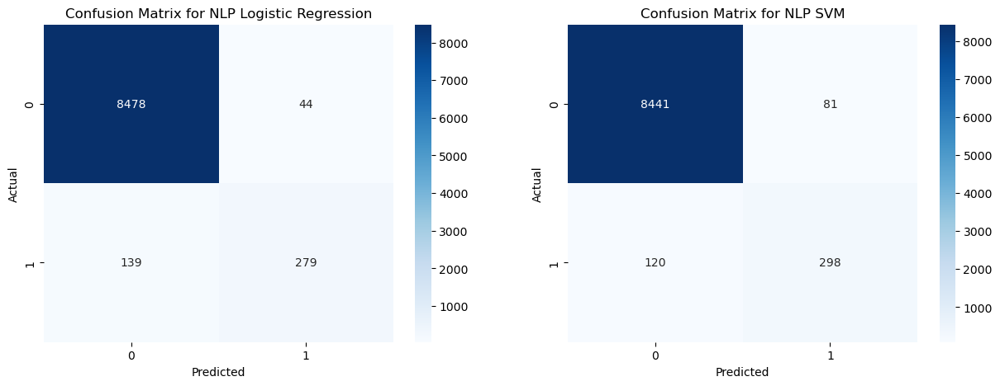

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

Classification report for logistic regression:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      8522
           1       0.86      0.67      0.75       418

    accuracy                           0.98      8940
   macro avg       0.92      0.83      0.87      8940
weighted avg       0.98      0.98      0.98      8940

Classification report for SVM:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      8522
           1       0.79      0.71      0.75       418

    accuracy                           0.98      8940
   macro avg       0.89      0.85      0.87      8940
weighted avg       0.98      0.98      0.98      8940



In [6]:
#MODELS EVALUATION:
print('NLP MODELS EVALUATION:')
print("WARNING: The purpose of nlp scoring and subsequent models is to provide variables for futher modelling, this is just to ensure that text gave us some useful information in relation with final model's target value")
fraud_predictions_lr = fraud_logreg.predict(new_X_test) 
fraud_predictions_svm = fraud_svm.predict(new_X_test) 
acc_lr = accuracy_score(new_Y_test,fraud_predictions_lr)
acc_svm = accuracy_score(new_Y_test,fraud_predictions_svm)
prec_lr = precision_score(new_Y_test,fraud_predictions_lr)
prec_svm = precision_score(new_Y_test,fraud_predictions_svm)
recall_lr = recall_score(new_Y_test,fraud_predictions_lr)
recall_svm = recall_score(new_Y_test,fraud_predictions_svm)
f1_lr = f1_score(new_Y_test,fraud_predictions_lr)
f1_svm = f1_score(new_Y_test,fraud_predictions_svm)
roc_lr = roc_auc_score(new_Y_test,fraud_predictions_lr)
roc_svm = roc_auc_score(new_Y_test,fraud_predictions_svm)
print('Accuracy: Logistic Regression - ' + str(acc_lr*100) + '%, SVM - ' + str(acc_svm*100) + '%')
print('Precision: Logistic Regression - ' + str(prec_lr*100) + '%, SVM - ' + str(prec_svm*100) + '%')
print('Recall: Logistic Regression - ' + str(recall_lr*100) + '%, SVM - ' + str(recall_svm*100) + '%')
print('F1: Logistic Regression - ' + str(f1_lr*100) + '%, SVM - ' + str(f1_svm*100) + '%')
print('Area Under ROC: Logistic Regression - ' + str(roc_lr*100) + '%, SVM - ' + str(roc_svm*100) + '%')
conf_matrix_lr = confusion_matrix(fraud_Y_test,fraud_predictions_lr)
conf_matrix_svm = confusion_matrix(fraud_Y_test,fraud_predictions_svm)
confusion_matrix_df_lr = pd.DataFrame(conf_matrix_lr)
confusion_matrix_df_svm = pd.DataFrame(conf_matrix_svm)

#plotting confussion matrixes:
fig,axs = plt.subplots(nrows=1,ncols=2, figsize=(15,5))
plt.figure(figsize=(6, 6))
sns.heatmap(ax=axs[0], data=confusion_matrix_df_lr, annot=True, fmt="d", cmap='Blues')
axs[0].set_title('Confusion Matrix for NLP Logistic Regression')
axs[0].set(xlabel='Predicted',ylabel='Actual')
plt.figure(figsize=(6, 6))
sns.heatmap(ax=axs[1], data=confusion_matrix_df_svm, annot=True, fmt="d", cmap='Blues')
axs[1].set_title('Confusion Matrix for NLP SVM')
axs[1].set(xlabel='Predicted',ylabel='Actual')
plt.tight_layout()
plt.show()

print('Classification report for logistic regression:')
print(classification_report(fraud_Y_test,fraud_predictions_lr))
print('Classification report for SVM:')
print(classification_report(fraud_Y_test,fraud_predictions_svm))

In [7]:
#DEEPER ANALYTICS:
print('DEEPER ANALYTICS:')
fraud_probabilities_lr = fraud_model_lr.predict_proba(new_X_test)
fraud_probabilities_svm = fraud_model_svm.predict_proba(new_X_test)
fraud_proba_lr_list = []
for item in fraud_probabilities_lr:
    fraud_proba_lr_list.append(item[1])
fraud_proba_svm_list = []
for item in fraud_probabilities_svm:
    fraud_proba_svm_list.append(item[1])

df_test = pd.DataFrame({'case_no' : fraud_X_test.index,
                                'class' : new_Y_test.to_list(),
                                'prediction_logreg' : fraud_predictions_lr,
                                'prediction_svm' : fraud_predictions_svm,
                                'probability_logreg' : fraud_proba_lr_list,
                                'probability_svm' : fraud_proba_svm_list
                       }, 
                                columns=['case_no','class','prediction_logreg','prediction_svm','probability_logreg','probability_svm'])
df_test.set_index('case_no')
df_positive = df_test[df_test['class']==1]
df_negative = df_test[df_test['class']==0]
print('Logistic Regression:')
print('Average score of negative class : ',df_negative['probability_logreg'].mean())
print('Average score of target class : ',df_positive['probability_logreg'].mean())
print('Median score of negative class : ',df_negative['probability_logreg'].median())
print('Median score of target class : ',df_positive['probability_logreg'].median())
print('Max score of negative class : ',df_negative['probability_logreg'].max())
print('Max score of target class : ',df_positive['probability_logreg'].max())
print('SVM:')
print('Average score of negative class : ',df_negative['probability_svm'].mean())
print('Average score of target class : ',df_positive['probability_svm'].mean())
print('Median score of negative class : ',df_negative['probability_svm'].median())
print('Median score of target class : ',df_positive['probability_svm'].median())
print('Max score of negative class : ',df_negative['probability_svm'].max())
print('Max score of target class : ',df_positive['probability_svm'].max())
print('\n')
print('Logistic Regression deep dive:')
if len(df_positive.loc[df_positive['prediction_logreg']==0]) > 0:
    print('False negatives:')
    print(df_positive.loc[df_positive['prediction_logreg']==0])
else:
    print('False negatives: None!')
if len(df_negative.loc[df_negative['prediction_logreg']==1]) > 0:
    print('False positives:')
    print(df_negative.loc[df_negative['prediction_logreg']==1])
else:
    print('False positives: None!')
print('\n')
df_test_sorted = df_test.sort_values('probability_logreg', ascending = [False])
df_test_sorted['prob_logreg[%]'] = df_test_sorted['probability_logreg'] * 100
df_test_sorted['prob_svm[%]'] = df_test_sorted['probability_svm'] * 100
print('20 cases with highest score in Logistic Regression Model:')
print(df_test_sorted[:20])
print('\n')
print('SVM deep dive:')
if len(df_positive.loc[df_positive['prediction_svm']==0]) > 0:
    print('False negatives:')
    print(df_positive.loc[df_positive['prediction_svm']==0])
else:
    print('False negatives: None!')
if len(df_negative.loc[df_negative['prediction_svm']==1]) > 0:
    print('False positives:')
    print(df_negative.loc[df_negative['prediction_svm']==1])
else:
    print('False positives: None!')
print('\n')

df_test_sorted = df_test.sort_values('probability_svm', ascending = [False])
print('20 cases with highest score in SVM model:')
df_test_sorted[:20]


DEEPER ANALYTICS:
Logistic Regression:
Average score of negative class :  0.019783784657555165
Average score of target class :  0.6316854757360834
Median score of negative class :  0.004792711456937711
Median score of target class :  0.8099896612892235
Max score of negative class :  0.9947409350471352
Max score of target class :  0.9998713321143328
SVM:
Average score of negative class :  0.013473036099519824
Average score of target class :  0.6425339152071416
Median score of negative class :  0.0014594546352741555
Median score of target class :  0.8857184065012893
Max score of negative class :  0.9999947830735267
Max score of target class :  0.9999999999665762


Logistic Regression deep dive:
False negatives:
      case_no  class  prediction_logreg  prediction_svm  probability_logreg  \
20       5579      1                  0               0            0.047767   
267      3147      1                  0               0            0.003469   
276     17586      1                  0     

,case_no,class,prediction_logreg,prediction_svm,probability_logreg,probability_svm
4112,17816,1,1,1,0.999823,1.000000
2049,17640,1,1,1,0.999611,1.000000
567,4833,1,1,1,0.999064,1.000000
6613,17536,1,1,1,0.998370,1.000000
5579,5611,1,1,1,0.997854,1.000000
1425,5435,1,1,1,0.999044,1.000000
3905,17778,1,1,1,0.998636,1.000000
8497,14129,1,1,1,0.996891,1.000000
8819,8394,1,1,1,0.996457,1.000000
7396,17330,1,1,1,0.995542,0.999999


In [8]:
#Scoring target set using chosen model: 
df_nlp_resampled = fit.transform(df_nlp_score)
nlp_proba_lr = fraud_model_lr.predict_proba(df_nlp_resampled)
nlp_proba_svm = fraud_model_svm.predict_proba(df_nlp_resampled)
nlp_proba_lr_list = []
for item in nlp_proba_lr:
    nlp_proba_lr_list.append(item[1]*100)
nlp_proba_svm_list = []
for item in nlp_proba_svm:
    nlp_proba_svm_list.append(item[1]*100)

df_nlp_models_add = pd.DataFrame({'case_no' : df_nlp_score.index,
                                'score_logreg' : nlp_proba_lr_list,
                                'score_svm' : nlp_proba_svm_list
                       }, 
                                columns=['case_no','score_logreg','score_svm'])
df_nlp_models_add = df_nlp_models_add.set_index('case_no')

df_target = df_target.join(df_nlp_models_add[['score_logreg','score_svm']])

In [9]:
#Saving CSV with processed dataframe:
df_target.to_csv('df_after_nlp.csv', sep=";", encoding='utf-8')

In [10]:
#closer look on variable connected with similarity:
df_target[df_target['is_similar']==1]

,telecommuting,has_company_logo,has_questions,missing_sum,salary,employment_group_Other,employment_group_Full-time,employment_group_Part-time,employment_group_Temporary,required_experience_Internship,required_experience_Not Applicable,required_experience_no data,required_experience_Mid-Senior level,required_experience_Associate,required_experience_Entry level,required_experience_Executive,required_experience_Director,education_Mid Risk,education_Low Risk,education_High Risk,education_Other,education_Super Risk,region_Low-Mid Risk,region_Zero Risk,region_Low Risk,region_High-Mid Risk,region_Mid Risk,region_High Risk,#fraudulent,is_similar,failed_perc,unique_perc,word_count,score_logreg,score_svm
job_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
17264,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,23.427332,0.000000,461,1.186836,0.538866
7805,0,1,1,2,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,21.691176,0.000000,272,1.467835,0.504773
17754,0,0,0,2,2,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,17.948718,0.000000,78,91.430557,89.333581
13788,1,1,0,3,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,22.292994,0.000000,157,0.102939,0.003576
11607,0,1,0,2,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,18.126888,0.000000,331,1.215002,0.284753
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8532,0,1,1,2,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,19.503546,0.000000,282,4.434075,1.489110
17589,0,0,0,1,7,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,22.368421,0.000000,152,94.528863,92.985864
2419,0,1,0,2,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,21.911422,0.000000,429,0.078943,0.014235
